# Does the click earn its place? Click-seeded template matching vs a seedless blob detector

**The product question.** A pathologist clicks **one** mitotic figure in a ~2 mm2 region of
interest and the tool returns a ranked list of locations to check. Everything here asks whether
that click buys anything a click-free detector could not have produced on its own.

**Three arms, and only three:**

| arm | what it is | sees the click? |
|---|---|---|
| `tm_ccoeff` | click-seeded template matching, unnormalised (`cv2.TM_CCOEFF`) | yes |
| `tm_ccoeff_normed` | identical, but `cv2.TM_CCOEFF_NORMED` (the incumbent) | yes |
| `blob` | `midog_utils.baselines.nucleus_blobs`, ranked by its own score | **no** |

The two template-matching arms differ in *exactly one* symbol -- the `cv2.matchTemplate`
constant. Same channel, same template bank, same seeds, same threshold rule, same suppression,
same evaluation ground truth. The blob arm is the control that decides whether the click is
worth anything at all.

---

## Read this before you read any number below

The prior template-matching work in this repository was produced by the same agent that wrote
this notebook. An independent audit of it found **15 defects after 4,257 of that agent's own
checks had passed**, including one (`TM_SQDIFF_NORMED`) that invalidated an entire arm: a
response map whose MAD collapsed to zero, so the extraction floor admitted ~28 million tied
pixels and the resulting "detections" were an artefact of tie-ordering.
`Research Logs/2026-09-01-tm-variant-sweep.md` section 8 lists all fifteen; section 9 documents
a framing bias in which the seedless detector was installed as the incumbent and template
matching had to clear a bar drawn from an unaudited file.

Two consequences, both load-bearing for this notebook:

1. **Prior conclusions in this repo are treated here as hypotheses, not findings.** Nothing
   below cites an earlier result as established.
2. **Every library function used is verified before it is used**, in section 2, with checks that
   would fail loudly rather than degrade quietly. A gate only catches what its author
   anticipated, so these are stated as what they do and do not cover.

One correction to the plan this notebook was built from, made before any result was computed
and recorded here because it changes headline numbers: **`nucleus_blobs` returns raw connected
components with no suppression**, while both template-matching arms pass through
`nms.nms_by_distance`. Because `evaluate.greedy_match` is one-to-one, every redundant blob
inside a match radius of an already-claimed annotation becomes a false positive *and* pushes
real discoveries deeper in the list. Measured before the sweep was written, suppression removes
19-36% of blob components. That mechanism is structural, so **all three arms are suppressed
identically.** Whether it moves any headline is a separate, empirical question, and asserting
the direction of a correction without measuring it is the habit section 9.4 of that log
documents. The unsuppressed pool is therefore carried through the whole notebook as a fourth
arm, `blob_raw`, and the measured size of the correction is reported in section 11 -- including
if it turns out to be negligible.

## 1. Configuration

Everything tunable is here. Runtime scales as `len(ROIS) x N_SEEDS`.

In [1]:
# --- what to run ---------------------------------------------------------------------------
# Every ROI in images/ that carries at least one mitotic annotation. 001.tiff is the sole
# exclusion: it has zero category-1 annotations, so it can neither be seeded nor scored.
ROIS = None          # None = all seedable ROIs on disk; or an explicit list of file names
N_SEEDS = 3          # distinct clicked annotations per ROI, drawn without replacement

# --- the pipeline, fixed across arms --------------------------------------------------------
CHANNEL_FN = "hematoxylin_od"  # UNCLIPPED optical density -- see section 3 for why not the
                               # rescaled `channels.to_hematoxylin`
BASE_SIZE = 51       # template side; the annotation box is 50x50, made odd so the click is
                     # the exact centre pixel
PATCH_SIZE = 73      # read this much so rotation never needs a fabricated pixel
N_ANGLES = 4
FLIPS = (False, True)
SCALES = (1.0,)      # SINGLE SCALE IS REQUIRED -- unnormalised scores grow with template pixel
                     # count, so max-fusing across sizes picks the biggest, not the best fit
FLOOR_Z = 0.5        # extraction floor = median + FLOOR_Z * MAD, per image, per method
PEAK_MIN_DISTANCE = 7
MAX_PEAKS = 500_000  # a cap that binds makes the candidate list a truncation of the score
                     # order rather than everything above the floor; asserted never to bind
SELF_HIT_RADIUS = 5.0  # a detection this close to the click is the click, not a discovery

# --- evaluation ------------------------------------------------------------------------------
K_GRID = (25, 50, 100, 250, 500, 1000, 2500, 5000)
K_BUDGET = 100       # the fixed reading budget used for false-positive composition
DEPTH_TARGETS = (0.50, 0.80, 0.95, 1.00)
TOPN_RETAIN = 500    # detections kept per (ROI, seed, arm) for the overlay figures

# --- presentation ----------------------------------------------------------------------------
FIG_DPI = 110
RNG_SEED = 0

In [2]:
import json, time, warnings
from collections import defaultdict
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.colors import ListedColormap
from scipy import stats

import midog_utils.dataset as ds
import midog_utils.channels as ch
import midog_utils.chromatin as cm
import midog_utils.template_match as tm
import midog_utils.baselines as bl
import midog_utils.evaluate as ev
import midog_utils.seed_selection as ss
from midog_utils.nms import nms_by_distance

plt.rcParams.update({"figure.dpi": FIG_DPI, "savefig.dpi": FIG_DPI, "font.size": 9,
                     "axes.grid": True, "grid.alpha": 0.25, "axes.axisbelow": True})
pd.set_option("display.width", 200, "display.max_columns", 60, "display.max_rows", 200)
warnings.filterwarnings("ignore", category=FutureWarning)

METHODS = {"tm_ccoeff": cv2.TM_CCOEFF, "tm_ccoeff_normed": cv2.TM_CCOEFF_NORMED}
TM_ARMS = tuple(METHODS)
ARMS = TM_ARMS + ("blob",)          # the three arms the comparison is about
ALL_ARMS = ARMS + ("blob_raw",)     # + the unsuppressed blob pool, reported but not compared
ARM_COLOUR = {"tm_ccoeff": "#1f77b4", "tm_ccoeff_normed": "#d62728",
              "blob": "#2ca02c", "blob_raw": "#8c8c8c"}
IMAGES = Path("images")
TIMINGS = defaultdict(float)

def timed(key):
    class _T:
        def __enter__(self): self.t = time.perf_counter(); return self
        def __exit__(self, *a): TIMINGS[key] += time.perf_counter() - self.t
    return _T()

print("cv2", cv2.__version__, "| numpy", np.__version__, "| pandas", pd.__version__)
print("TM_CCOEFF =", cv2.TM_CCOEFF, " TM_CCOEFF_NORMED =", cv2.TM_CCOEFF_NORMED)

cv2 4.8.1 | numpy 1.26.4 | pandas 2.2.2
TM_CCOEFF = 4  TM_CCOEFF_NORMED = 5


## 2. The data, and what its conventions actually are

`databases/MIDOG++.json` looks like COCO and is not. Two conventions matter and both are easy
to get wrong:

* `bbox` is `[x1, y1, x2, y2]` in absolute pixels, **not** `[x, y, w, h]`.
* Every one of the 26,286 boxes is exactly 50x50 and **synthetic** -- the real annotation is a
  single point click and the box is `point +- 25`. So every evaluation here is point-based,
  never IoU-based.

Category 1 is a mitotic figure. Category 2 is "not mitotic figure": a look-alike a pathologist
examined and rejected. Those are *hard negatives chosen by a human*, which is why a false
positive landing on one means something different from a false positive on unannotated tissue.

In [3]:
images_df, ann = ds.load_annotations()
ds.check_invariants(ann)

on_disk = sorted(p.name for p in IMAGES.glob("*.tiff"))
mit_counts = (ann[ann["category_id"] == ds.MITOTIC].groupby("file_name").size()
              .rename("n_mitotic"))
lk_counts = (ann[ann["category_id"] == ds.LOOKALIKE].groupby("file_name").size()
             .rename("n_lookalike"))

roi = (images_df[images_df["file_name"].isin(on_disk)]
       .merge(mit_counts, left_on="file_name", right_index=True, how="left")
       .merge(lk_counts, left_on="file_name", right_index=True, how="left"))
roi[["n_mitotic", "n_lookalike"]] = roi[["n_mitotic", "n_lookalike"]].fillna(0).astype(int)

excluded = roi[roi["n_mitotic"] == 0]["file_name"].tolist()
roi = roi[roi["n_mitotic"] > 0].sort_values(["tumor_type", "file_name"]).reset_index(drop=True)
print(f"{len(on_disk)} ROIs on disk; excluded for having no mitotic annotation: {excluded}")
print(f"{len(roi)} seedable ROIs across {roi['tumor_type'].nunique()} tumour domains")

18 ROIs on disk; excluded for having no mitotic annotation: ['001.tiff']
17 seedable ROIs across 7 tumour domains


### 2a. Resolution sanity check -- the one that catches a silently 6x-wrong match radius

Every metric below matches a detection to an annotation within `evaluate.radius_px(mpp)`, so a
misread scale tag would silently change what counts as a hit. 505.tiff and 506.tiff store
`ResolutionUnit = 3` (centimetre) while every other file stores `2` (inch). Reading them as
inches gives 0.578 um/px -- implying a 13 mm2 ROI. Correct values are ~0.22-0.26 um/px, and
every MIDOG++ ROI is ~2 mm2.

In [4]:
rows = []
for _, r in roi.iterrows():
    p = IMAGES / r["file_name"]
    mpp = ds.roi_mpp(p)
    area = ds.roi_area_mm2(p)
    rows.append({"file_name": r["file_name"], "tumor_type": r["tumor_type"],
                 "n_mitotic": r["n_mitotic"], "n_lookalike": r["n_lookalike"],
                 "mpp_um": round(mpp, 4), "match_radius_px": round(ev.radius_px(mpp), 2),
                 "roi_area_mm2": round(area, 3)})
roi = roi.merge(pd.DataFrame(rows)[["file_name", "mpp_um", "match_radius_px", "roi_area_mm2"]],
                on="file_name")
scale = pd.DataFrame(rows)

bad_mpp = scale[(scale["mpp_um"] < 0.20) | (scale["mpp_um"] > 0.28)]
bad_area = scale[(scale["roi_area_mm2"] < 1.9) | (scale["roi_area_mm2"] > 2.1)]
assert len(bad_mpp) == 0, f"mpp outside 0.20-0.28 um/px -- ResolutionUnit misread:\n{bad_mpp}"
assert len(bad_area) == 0, f"ROI area outside 1.9-2.1 mm2:\n{bad_area}"
print(f"PASS  all {len(scale)} ROIs: mpp in [{scale.mpp_um.min():.4f}, {scale.mpp_um.max():.4f}] um/px, "
      f"area in [{scale.roi_area_mm2.min():.3f}, {scale.roi_area_mm2.max():.3f}] mm2")
print(f"      match radius spans {scale.match_radius_px.min():.1f}-{scale.match_radius_px.max():.1f} px "
      "-- per image, never a constant\n")
display(scale)

PASS  all 17 ROIs: mpp in [0.2263, 0.2533] um/px, area in [1.998, 2.020] mm2
      match radius spans 29.6-33.1 px -- per image, never a constant



,file_name,tumor_type,n_mitotic,n_lookalike,mpp_um,match_radius_px,roi_area_mm2
0,300.tiff,canine cutaneous mast cell tumor,181,85,0.2533,29.61,2.000
1,301.tiff,canine cutaneous mast cell tumor,218,109,0.2533,29.61,2.000
2,201.tiff,canine lung cancer,18,49,0.2482,30.22,1.998
3,202.tiff,canine lung cancer,16,28,0.2482,30.22,1.998
4,245.tiff,canine lymphosarcoma,90,70,0.2482,30.22,1.998
5,246.tiff,canine lymphosarcoma,116,123,0.2482,30.22,1.998
6,405.tiff,canine soft tissue sarcoma,14,19,0.2482,30.22,1.998
7,406.tiff,canine soft tissue sarcoma,6,43,0.2482,30.22,1.998
8,459.tiff,canine soft tissue sarcoma,131,90,0.2482,30.22,1.998
9,002.tiff,human breast cancer,9,7,0.2269,33.05,2.010


### 2b. Seed eligibility is narrower than the mitosis count

A seed is not "any mitotic annotation". `seed_selection.agreement_pool` first keeps only
annotations that **every rater who saw them called mitotic**; if an ROI has none, it falls back
to the majority-mitotic contested set and flags the ROI. A border filter then removes
annotations sitting closer than 36 px to the ROI edge, because a full 73x73 padded patch cannot
be read there and padding would feed fabricated pixels into the template.

The gap is large: 548.tiff has 239 mitotic annotations and 184 eligible seeds; 201.tiff has 18
and **7**. This table is also where unequal seed counts become visible -- a "worst of 3" and a
"worst of 2" must never be pooled unlabelled.

In [5]:
import tifffile
elig = []
for _, r in roi.iterrows():
    fn = r["file_name"]
    with tifffile.TiffFile(IMAGES / fn) as tf:
        s = tf.series[0]
        lv = getattr(s, "levels", None)
        shape = (lv[0].shape if lv else s.shape)[:2]
    g = ann[(ann["file_name"] == fn) & (ann["category_id"] == ds.MITOTIC)]
    pool, flagged = ss.agreement_pool(g)
    eligible = ss.border_filter(pool, PATCH_SIZE // 2, shape)
    elig.append({"file_name": fn, "tumor_type": r["tumor_type"], "shape": f"{shape[0]}x{shape[1]}",
                 "n_mitotic": len(g), "n_agreed": len(pool), "n_eligible": len(eligible),
                 "no_unanimous": flagged, "n_seeds_run": min(N_SEEDS, len(eligible))})
elig = pd.DataFrame(elig)
roi = roi.merge(elig[["file_name", "n_eligible", "no_unanimous", "n_seeds_run"]], on="file_name")

short = elig[elig["n_seeds_run"] < N_SEEDS]
print(f"ROIs supplying fewer than N_SEEDS={N_SEEDS} distinct eligible seeds: "
      f"{short['file_name'].tolist() or 'none'}")
print(f"ROIs with no unanimously-mitotic annotation (seeded from the contested set): "
      f"{elig[elig['no_unanimous']]['file_name'].tolist() or 'none'}")
print(f"total cells to run: {int(elig['n_seeds_run'].sum())} (ROI x seed), "
      f"x {len(ARMS)} arms\n")
display(elig)

ROIs supplying fewer than N_SEEDS=3 distinct eligible seeds: ['505.tiff']
ROIs with no unanimously-mitotic annotation (seeded from the contested set): ['505.tiff', '350.tiff']
total cells to run: 50 (ROI x seed), x 3 arms



,file_name,tumor_type,shape,n_mitotic,n_agreed,n_eligible,no_unanimous,n_seeds_run
0,300.tiff,canine cutaneous mast cell tumor,4835x6447,181,131,127,False,3
1,301.tiff,canine cutaneous mast cell tumor,4835x6447,218,164,162,False,3
2,201.tiff,canine lung cancer,4933x6577,18,7,7,False,3
3,202.tiff,canine lung cancer,4933x6577,16,4,4,False,3
4,245.tiff,canine lymphosarcoma,4933x6577,90,78,78,False,3
5,246.tiff,canine lymphosarcoma,4933x6577,116,100,97,False,3
6,405.tiff,canine soft tissue sarcoma,4933x6577,14,10,10,False,3
7,406.tiff,canine soft tissue sarcoma,4933x6577,6,4,4,False,3
8,459.tiff,canine soft tissue sarcoma,4933x6577,131,122,121,False,3
9,002.tiff,human breast cancer,5412x7215,9,7,7,False,3


In [6]:
if ROIS is not None:
    roi = roi[roi["file_name"].isin(ROIS)].reset_index(drop=True)
RUN_ROIS = roi["file_name"].tolist()
print(f"running {len(RUN_ROIS)} ROIs:", ", ".join(RUN_ROIS))

running 17 ROIs: 300.tiff, 301.tiff, 201.tiff, 202.tiff, 245.tiff, 246.tiff, 405.tiff, 406.tiff, 459.tiff, 002.tiff, 094.tiff, 505.tiff, 506.tiff, 548.tiff, 350.tiff, 351.tiff, 402.tiff


## 3. Verifying the library before using it

The prior work in this repo passed 4,257 of its own checks and still contained an arm whose
every number was a tie-breaking artefact. So each component is checked here against something
external to it -- a known planted position, a float64 recomputation, an independent re-run --
rather than against its own internal consistency.

What these checks do **not** cover is stated with each one.

### 3.1 Coordinate round-trip, per method

`cv2.matchTemplate` returns a map indexed by the template's **top-left** corner. Entry `(r, c)`
of a `t`-sized template's map describes a window whose *centre* is `(c + (t-1)//2, r + (t-1)//2)`.
`fused_response` must shift each augmentation's map by half of **its own** size before taking
the element-wise maximum. Getting that wrong displaces every detection by 10-25 px -- which, at
a ~30 px match radius, looks exactly like "template matching does not work on H&E" rather than
like a bug.

This check plants each template into a noise canvas at a known centre, matches the *whole* bank
against that canvas, and requires the peak of the **fused** map to land within 1 px. It is run
**per method** because it also catches a sign error: with a distance method left un-negated the
planted location is the map's *minimum*, so the argmax lands on arbitrary noise.

*Not covered:* this uses a synthetic canvas drawn from the template's own distribution. It
proves the geometry and the sign, not that the score is meaningful on tissue.

In [7]:
seed_rgb = ds.load_roi(IMAGES / RUN_ROIS[0])
seed_hem = cm.hematoxylin_od(seed_rgb)
_g = ann[(ann["file_name"] == RUN_ROIS[0]) & (ann["category_id"] == ds.MITOTIC)]
_p, _ = ss.agreement_pool(_g)
_p = ss.border_filter(_p, PATCH_SIZE // 2, seed_hem.shape)
_demo = _p.iloc[0]
demo_patch = tm.read_padded_patch(seed_hem, _demo["cx"], _demo["cy"], PATCH_SIZE)
demo_tpls, demo_metas = tm.build_augmentations(demo_patch, BASE_SIZE, SCALES, N_ANGLES, FLIPS)
assert len(demo_tpls) == N_ANGLES * len(FLIPS) * len(SCALES) == 8, len(demo_tpls)
assert all(t.shape == (BASE_SIZE, BASE_SIZE) for t in demo_tpls), "templates must share one size"

rows = []
for name, meth in METHODS.items():
    with timed("verify"):
        res = tm.plant_and_recover(demo_tpls, demo_metas, canvas=257, tolerance=1.0,
                                   rng=np.random.default_rng(RNG_SEED), method=meth)
    dxy = np.array([(dx, dy) for _, dx, dy, _ in res])
    rows.append({"method": name, "n_templates": len(res),
                 "max_abs_dx": int(np.abs(dxy[:, 0]).max()),
                 "max_abs_dy": int(np.abs(dxy[:, 1]).max()), "tolerance_px": 1.0,
                 "passed": bool(np.abs(dxy).max() <= 1.0)})
rt = pd.DataFrame(rows)
assert rt["passed"].all(), rt
print("PASS  fused-map peak recovers the planted centre within 1 px, for every template, "
      "under both methods")
display(rt)

PASS  fused-map peak recovers the planted centre within 1 px, for every template, under both methods


,method,n_templates,max_abs_dx,max_abs_dy,tolerance_px,passed
0,tm_ccoeff,8,0,0,1.0,True
1,tm_ccoeff_normed,8,0,0,1.0,True


### 3.2 Is OpenCV's response map the quantity we think it is?

OpenCV computes a 51x51 correlation by DFT in float32, so its map is an approximation of the
textbook sum. This recomputes both scores in float64 at ~200 random windows of a real
hematoxylin-OD ROI and reports the **relative** error.

Relative, not absolute, is the point: hematoxylin OD values are ~1e-2, so an absolute tolerance
either passes trivially or fails spuriously. Definitions being checked, for a window `I` and
template `T` with means subtracted (`T' = T - mean T`):

* `TM_CCOEFF` = `sum(T' * I')`
* `TM_CCOEFF_NORMED` = `sum(T' * I') / sqrt(sum(T'^2) * sum(I'^2))`

A single template is used, not the fused bank -- fusion offsets are section 3.1's job, and
mixing the two would confound which one failed.

In [8]:
rng = np.random.default_rng(RNG_SEED)
crop = seed_hem[:1200, :1200].astype(np.float32)
T = demo_tpls[0].astype(np.float32)
t_side = T.shape[0]
Td = T.astype(np.float64); Tc = Td - Td.mean(); Tss = float((Tc ** 2).sum())

rows = []
for name, meth in METHODS.items():
    res = np.asarray(cv2.matchTemplate(crop, T, meth), dtype=np.float64)
    ys = rng.integers(0, res.shape[0], 200); xs = rng.integers(0, res.shape[1], 200)
    got, want = [], []
    for y, x in zip(ys, xs):
        W = crop[y:y + t_side, x:x + t_side].astype(np.float64)
        Wc = W - W.mean()
        num = float((Tc * Wc).sum())
        den = np.sqrt(Tss * float((Wc ** 2).sum()))
        want.append(num if meth == cv2.TM_CCOEFF else (num / den if den > 0 else 0.0))
        got.append(res[y, x])
    got, want = np.array(got), np.array(want)
    scale = np.maximum(np.abs(want), np.abs(want).max() * 1e-6)  # guard near-zero denominators
    rel = np.abs(got - want) / scale
    rows.append({"method": name, "n_windows": len(got), "value_range":
                 f"[{want.min():.4g}, {want.max():.4g}]",
                 "max_rel_err": float(rel.max()), "median_rel_err": float(np.median(rel)),
                 "passed": bool(rel.max() < 1e-3)})
bf = pd.DataFrame(rows)
assert bf["passed"].all(), bf
print("PASS  OpenCV agrees with a float64 recomputation of the textbook formula "
      "to better than 1e-3 relative, for both methods")
display(bf)

PASS  OpenCV agrees with a float64 recomputation of the textbook formula to better than 1e-3 relative, for both methods


,method,n_windows,value_range,max_rel_err,median_rel_err,passed
0,tm_ccoeff,200,"[-1.311, 2.423]",0.000235,5.622300e-07,True
1,tm_ccoeff_normed,200,"[-0.2953, 0.6294]",0.000146,5.843107e-07,True


### 3.3 The suppression shortcut

The candidate pool is extracted **once** per (ROI, seed, method) at a deep floor, and every
budgeted metric is then read off a prefix of that one ranked list. That is only legitimate if
truncating the deep pool is identical to having run the whole pipeline at the shallower cut.

Two things are asserted, on a real full-size ROI:

1. **Threshold equivalence.** Filtering the deep pool at score `t` yields the *identical
   coordinate set* -- not merely the same count -- as re-extracting, re-suppressing and
   re-dropping the self-hit at `t`. This holds because `extract_peaks` orders peaks by a global
   key (score, then x, then y) and `nms_by_distance` sorts stably, so greedy suppression
   restricts to any prefix unchanged.
2. **Greedy prefix consistency.** `evaluate.greedy_match` walks detections in rank order, so
   the assignment for the first `n` detections cannot depend on detections after them.
   Therefore `matched_rank < K` is exactly "found within the top K", which is what lets every
   `recall@K` and every reading depth below be read off one full-list match.

The audit found the prior version of check 1 passing **vacuously** on a degenerate map (the cut
equalled the floor, so it compared against an unfiltered re-extraction). Here the cut is set
strictly above the floor and the check asserts the two sets are non-empty and strictly smaller
than the pool.

In [9]:
def extract_pool(fused, valid, radius, seed_xy, floor, max_peaks=None):
    '''Peaks -> distance NMS -> drop the click's own self-match. The shared back half.'''
    centers, scores = tm.extract_peaks(fused, valid, PEAK_MIN_DISTANCE, floor,
                                       MAX_PEAKS if max_peaks is None else max_peaks)
    n_peaks = len(centers)
    keep = nms_by_distance(centers, scores, radius)
    centers, scores = centers[keep], scores[keep]
    n_self = 0
    if seed_xy is not None and len(centers):
        ok = np.hypot(centers[:, 0] - seed_xy[0], centers[:, 1] - seed_xy[1]) > SELF_HIT_RADIUS
        n_self = int((~ok).sum())
        centers, scores = centers[ok], scores[ok]
    return centers, scores, n_peaks, n_self

_radius = float(roi.loc[roi["file_name"] == RUN_ROIS[0], "match_radius_px"].iloc[0])
_seed_xy = (float(_demo["cx"]), float(_demo["cy"]))

# A display window centred on a mitotic figure that is NOT the seed, reused by section 5.
_others = _g[_g["ann_id"] != int(_demo["ann_id"])]
_h, _w = seed_hem.shape
_ok = _others[(_others["cx"] > 300) & (_others["cx"] < _w - 300)
              & (_others["cy"] > 300) & (_others["cy"] < _h - 300)]
_c = _ok.iloc[len(_ok) // 2]
_HALF = 250
DEMO_WIN = (int(_c["cy"]) - _HALF, int(_c["cy"]) + _HALF, int(_c["cx"]) - _HALF, int(_c["cx"]) + _HALF)
DEMO_MAPS = {}

rows = []
for name, meth in METHODS.items():
    with timed("verify"):
        fused, _, valid = tm.fused_response(seed_hem, demo_tpls, method=meth)
        med, mad = tm.robust_stats(fused, valid)
        floor = med + FLOOR_Z * mad
        c0, s0, _, _ = extract_pool(fused, valid, _radius, _seed_xy, floor)
        cut = float(np.quantile(s0, 0.60))                    # strictly above the floor
        c1, s1, _, _ = extract_pool(fused, valid, _radius, _seed_xy, cut)
        filt = c0[s0 >= cut]
    y0, y1, x0, x1 = DEMO_WIN
    DEMO_MAPS[name] = {"map": fused[y0:y1, x0:x1].copy(), "median": med, "mad": mad,
                       "floor": floor}
    a = c1[np.lexsort((c1[:, 1], c1[:, 0]))]
    b = filt[np.lexsort((filt[:, 1], filt[:, 0]))]
    ok = a.shape == b.shape and np.array_equal(a, b)
    rows.append({"method": name, "pool_at_floor": len(c0), "cut": round(cut, 6),
                 "re_extracted_at_cut": len(a), "pool_filtered_at_cut": len(b),
                 "identical_coords": bool(ok),
                 "non_vacuous": bool(len(a) > 0 and len(a) < len(c0))})
    del fused, valid
sc = pd.DataFrame(rows)
assert sc["identical_coords"].all() and sc["non_vacuous"].all(), sc
print("PASS  filtering the deep pool == re-running the pipeline at that cut (identical "
      "coordinates), and the check is non-vacuous")
display(sc)

PASS  filtering the deep pool == re-running the pipeline at that cut (identical coordinates), and the check is non-vacuous


,method,pool_at_floor,cut,re_extracted_at_cut,pool_filtered_at_cut,identical_coords,non_vacuous
0,tm_ccoeff,15455,2.070736,6182,6182,True,True
1,tm_ccoeff_normed,16534,0.573140,6614,6614,True,True


In [10]:
# Greedy prefix consistency: matched_rank < K  <=>  found in the top K.
gt_all = ann[ann["file_name"] == RUN_ROIS[0]]
gt_eval = gt_all[gt_all["ann_id"] != int(_demo["ann_id"])].reset_index(drop=True)
pool_df = pd.DataFrame({"cx": c0[:, 0], "cy": c0[:, 1], "score": s0})
det_full, gtf = ev.bucket_detections(pool_df, gt_eval, _radius)
mism = []
for K in (25, 100, 1000, 5000):
    _, gtk = ev.bucket_detections(pool_df.head(K), gt_eval, _radius)
    a = set(gtf.loc[(gtf["matched_rank"] >= 0) & (gtf["matched_rank"] < K), "ann_id"])
    b = set(gtk.loc[gtk["found"], "ann_id"])
    mism.append({"K": K, "from_full_list_ranks": len(a), "from_re_match_on_prefix": len(b),
                 "identical": a == b})
pc = pd.DataFrame(mism)
assert pc["identical"].all(), pc
print("PASS  greedy matching is prefix-consistent, so every recall@K and reading depth below "
      "can be read off one full-list match")
display(pc)

PASS  greedy matching is prefix-consistent, so every recall@K and reading depth below can be read off one full-list match


,K,from_full_list_ranks,from_re_match_on_prefix,identical
0,25,11,11,True
1,100,33,33,True
2,1000,103,103,True
3,5000,195,195,True


### 3.4 The blob detector really is seedless

`nucleus_blobs` never receives the click, so its candidate list must be byte-identical no
matter which annotation is clicked. This is checked by **calling it twice** on two ROIs and
comparing frames -- not by comparing a cached list against itself, which would prove nothing.

The wording matters and the audit corrected the prior log on exactly this point: the *candidate
list* is identical across seeds. The blob arm's **metrics still vary across seeds**, because
the evaluation ground truth drops a different annotation each time. That is a real source of
variance and it is not the same thing as the arm being unstable.

In [11]:
rows = []
for fn in RUN_ROIS[:2]:
    rgb = ds.load_roi(IMAGES / fn)
    with timed("verify"):
        b1 = bl.nucleus_blobs(rgb)
        b2 = bl.nucleus_blobs(rgb)
    r = float(roi.loc[roi["file_name"] == fn, "match_radius_px"].iloc[0])
    k = nms_by_distance(b1[["cx", "cy"]].to_numpy(), b1["score"].to_numpy(), r)
    rows.append({"file_name": fn, "n_components": len(b1), "identical_on_recompute": b1.equals(b2),
                 "n_after_nms": len(k),
                 "pct_removed_by_nms": round(100 * (1 - len(k) / max(len(b1), 1)), 1)})
    del rgb
bd = pd.DataFrame(rows)
assert bd["identical_on_recompute"].all(), bd
print("PASS  nucleus_blobs is deterministic on recomputation and independent of the click")
print("      note the NMS column: suppression removes a large minority of components. Omitting "
      "it\n      from the blob arm while applying it to the TM arms would have been the single "
      "biggest\n      asymmetry in this comparison.")
display(bd)

PASS  nucleus_blobs is deterministic on recomputation and independent of the click
      note the NMS column: suppression removes a large minority of components. Omitting it
      from the blob arm while applying it to the TM arms would have been the single biggest
      asymmetry in this comparison.


,file_name,n_components,identical_on_recompute,n_after_nms,pct_removed_by_nms
0,300.tiff,17376,True,13341,23.2
1,301.tiff,20370,True,14518,28.7


## 4. The channel, and why the obvious one destroys the signal under test

Both template-matching arms search a single-channel image derived from RGB by colour
deconvolution. There are two hematoxylin channels in this repo and the choice between them is
not cosmetic:

* `chromatin.hematoxylin_od` -- the raw hematoxylin optical density from `rgb2hed`. **Unclipped.**
* `channels.to_hematoxylin` -- the same channel, then rescaled to 0-255 between the ROI's own
  0.5 / 99.5 percentiles **and clipped**.

The clipped variant parks 0.5% of pixels on the 255 ceiling by construction, and those pixels
are precisely the densest chromatin. `TM_CCOEFF_NORMED` is invariant to `I -> aI + b` and cannot
tell the difference. `TM_CCOEFF` is not -- it reads that magnitude directly. Using the clipped
channel would therefore delete the very signal that distinguishes the two arms, and the
comparison would be measuring nothing.

The figure below shows this for one mitotic figure per tumour domain. The right-hand column
marks in red every pixel the clipped variant saturates.

In [12]:
demo_rois, seen = [], set()
for fn in RUN_ROIS:
    t = roi.loc[roi["file_name"] == fn, "tumor_type"].iloc[0]
    if t not in seen:
        seen.add(t); demo_rois.append(fn)
print("one ROI per domain for the preprocessing figure:", demo_rois)

panels, clip_stats = [], []
for fn in demo_rois:
    with timed("preproc_fig"):
        rgb = ds.load_roi(IMAGES / fn)
        od = cm.hematoxylin_od(rgb)
        clipped = ch.to_hematoxylin(rgb)          # full-ROI percentiles, as it is really used
    sat = float((clipped >= 255.0).mean())
    g = ann[(ann["file_name"] == fn) & (ann["category_id"] == ds.MITOTIC)]
    h, w = od.shape
    gg = g[(g.cx > 200) & (g.cx < w - 200) & (g.cy > 200) & (g.cy < h - 200)]
    c = gg.iloc[len(gg) // 2]
    y, x, hf = int(c["cy"]), int(c["cx"]), 90
    sl = (slice(y - hf, y + hf), slice(x - hf, x + hf))
    panels.append((fn, roi.loc[roi["file_name"] == fn, "tumor_type"].iloc[0],
                   rgb[sl], od[sl].copy(), clipped[sl].copy()))
    # how much of THIS patch is destroyed, vs the ROI as a whole
    clip_stats.append({"file_name": fn,
                       "tumor_type": roi.loc[roi["file_name"] == fn, "tumor_type"].iloc[0],
                       "roi_frac_at_ceiling": round(sat, 5),
                       "patch_frac_at_ceiling": round(float((clipped[sl] >= 255.0).mean()), 4),
                       "od_min": round(float(od.min()), 4), "od_max": round(float(od.max()), 4),
                       "od_p99_5": round(float(np.percentile(od[::8, ::8], 99.5)), 4)})
    del rgb, od, clipped
clip_df = pd.DataFrame(clip_stats)

one ROI per domain for the preprocessing figure: ['300.tiff', '201.tiff', '245.tiff', '405.tiff', '002.tiff', '505.tiff', '350.tiff']


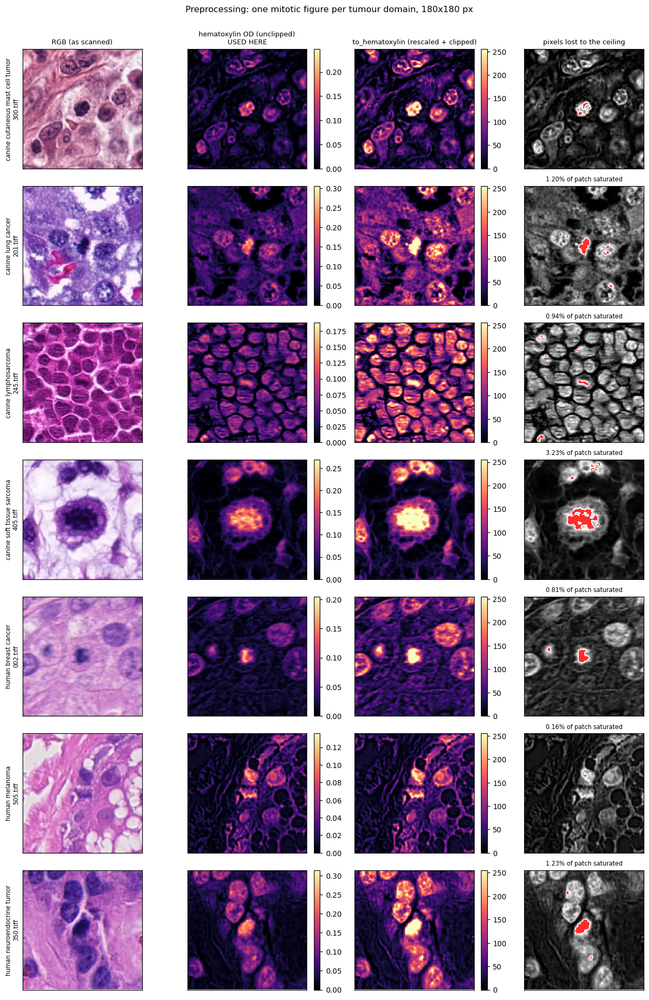

,file_name,tumor_type,roi_frac_at_ceiling,patch_frac_at_ceiling,od_min,od_max,od_p99_5
0,300.tiff,canine cutaneous mast cell tumor,0.00500,0.0051,0.0,0.3097,0.1434
1,201.tiff,canine lung cancer,0.00500,0.0120,0.0,0.4239,0.1709
2,245.tiff,canine lymphosarcoma,0.00500,0.0094,0.0,1.7650,0.1047
3,405.tiff,canine soft tissue sarcoma,0.00501,0.0323,0.0,0.3407,0.1686
4,002.tiff,human breast cancer,0.00500,0.0081,0.0,0.2383,0.1046
5,505.tiff,human melanoma,0.00500,0.0016,0.0,0.2727,0.1099
6,350.tiff,human neuroendocrine tumor,0.00500,0.0123,0.0,0.4001,0.1946


The saturated pixels are not scattered noise -- they sit on the chromatin. Every one is a
magnitude difference TM_CCOEFF would have read and the clipped channel has thrown away.


In [13]:
n = len(panels)
fig, axes = plt.subplots(n, 4, figsize=(11.5, 2.45 * n))
for i, (fn, tt, rgb_p, od_p, cl_p) in enumerate(panels):
    axes[i, 0].imshow(rgb_p); axes[i, 0].set_ylabel(f"{tt}\n{fn}", fontsize=7.5)
    im1 = axes[i, 1].imshow(od_p, cmap="magma")
    plt.colorbar(im1, ax=axes[i, 1], fraction=0.046)
    im2 = axes[i, 2].imshow(cl_p, cmap="magma", vmin=0, vmax=255)
    plt.colorbar(im2, ax=axes[i, 2], fraction=0.046)
    axes[i, 3].imshow(cl_p, cmap="gray", vmin=0, vmax=255)
    sat_mask = np.ma.masked_where(cl_p < 255.0, np.ones_like(cl_p))
    axes[i, 3].imshow(sat_mask, cmap=ListedColormap(["#ff2d2d"]), vmin=0, vmax=1)
    pct = 100 * float((cl_p >= 255.0).mean())
    axes[i, 3].set_title(f"{pct:.2f}% of patch saturated", fontsize=7.5)
    for j in range(4):
        axes[i, j].set_xticks([]); axes[i, j].set_yticks([]); axes[i, j].grid(False)
for j, t in enumerate(["RGB (as scanned)", "hematoxylin OD (unclipped)\nUSED HERE",
                       "to_hematoxylin (rescaled + clipped)", "pixels lost to the ceiling"]):
    axes[0, j].set_title(t + ("" if j != 3 else ""), fontsize=8.5)
fig.suptitle("Preprocessing: one mitotic figure per tumour domain, 180x180 px", y=1.002)
fig.tight_layout(); plt.show()
display(clip_df)
print("The saturated pixels are not scattered noise -- they sit on the chromatin. Every one is "
      "a\nmagnitude difference TM_CCOEFF would have read and the clipped channel has thrown away.")

## 5. The template, and the response maps it produces

### 5.1 The template bank

The clicked annotation gives a 51x51 template. A 73x73 patch is read first so that rotation
never needs a fabricated border pixel -- the far corner of the inner 51x51 sits `25*sqrt(2)` =
35.4 px from the centre and the patch reaches 36 px -- then rotated, then centre-cropped back to
51x51.

`n_angles=4`, `flips=(False, True)`, `scales=(1.0,)` gives **8 templates**, fused by
element-wise maximum. Mitotic figures have no canonical orientation, so the rotations are the
part that matters.

**Single scale is not a convenience, it is a correctness requirement.** `TM_CCOEFF` is a sum
over template pixels, so its score grows with template area. An element-wise maximum over a
bank of *different sizes* would be decided by which template is biggest, not by which one fits.
The assertion below is that all 8 templates share one size.

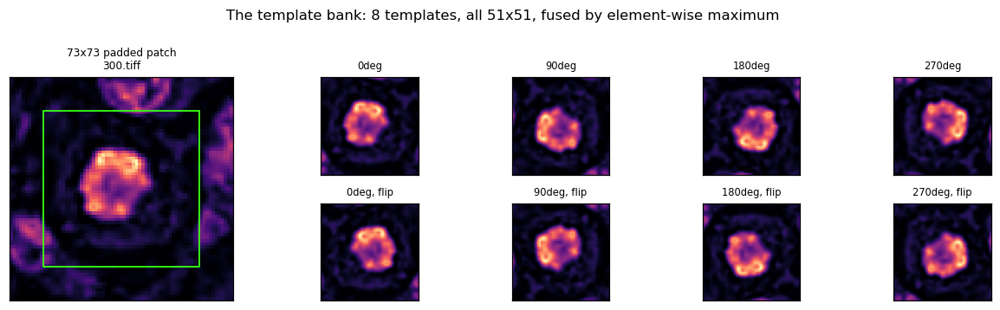

sizes: [(51, 51)] | single size asserted in section 3.1 -- required for the unnormalised arm to be honest


In [14]:
fig = plt.figure(figsize=(11.5, 3.1))
gs = gridspec.GridSpec(2, 5, figure=fig, width_ratios=[1.6, 1, 1, 1, 1])
ax = fig.add_subplot(gs[:, 0])
ax.imshow(demo_patch, cmap="magma"); ax.set_title(f"73x73 padded patch\n{RUN_ROIS[0]}", fontsize=8)
ax.add_patch(plt.Rectangle(((PATCH_SIZE - BASE_SIZE) / 2 - 0.5, (PATCH_SIZE - BASE_SIZE) / 2 - 0.5),
                           BASE_SIZE, BASE_SIZE, fill=False, ec="#39ff14", lw=1.2))
ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
vmin, vmax = float(min(t.min() for t in demo_tpls)), float(max(t.max() for t in demo_tpls))
for i, (t, m) in enumerate(zip(demo_tpls, demo_metas)):
    a = fig.add_subplot(gs[i // 4, 1 + i % 4])
    a.imshow(t, cmap="magma", vmin=vmin, vmax=vmax)
    a.set_title(f"{m.angle:.0f}deg{', flip' if m.flip else ''}", fontsize=7.5)
    a.set_xticks([]); a.set_yticks([]); a.grid(False)
fig.suptitle("The template bank: 8 templates, all 51x51, fused by element-wise maximum", y=1.03)
fig.tight_layout(); plt.show()
print("sizes:", sorted({t.shape for t in demo_tpls}),
      "| single size asserted in section 3.1 -- required for the unnormalised arm to be honest")

### 5.2 What normalisation removes

The same crop of the same ROI, under both methods. These are the *real* maps from the
verification run in section 3.3, not a re-computation on a crop -- so the median/MAD statistics
and the dashed extraction floor on the histograms are the whole-ROI values the sweep actually
uses.

The two maps rank different things. `TM_CCOEFF` is a raw sum of products of mean-centred
values, so it rewards a window that is both *shaped* like the template and *dark* like it.
`TM_CCOEFF_NORMED` divides that by the window's own energy, so it is invariant to `I -> aI + b`
and rewards shape alone: a pale, low-contrast structure with the seed's pattern scores the same
as a dense one. The scales are not comparable between the two panels -- which is exactly why the
threshold is per-map (`median + 0.5 x MAD`) rather than a fixed number.

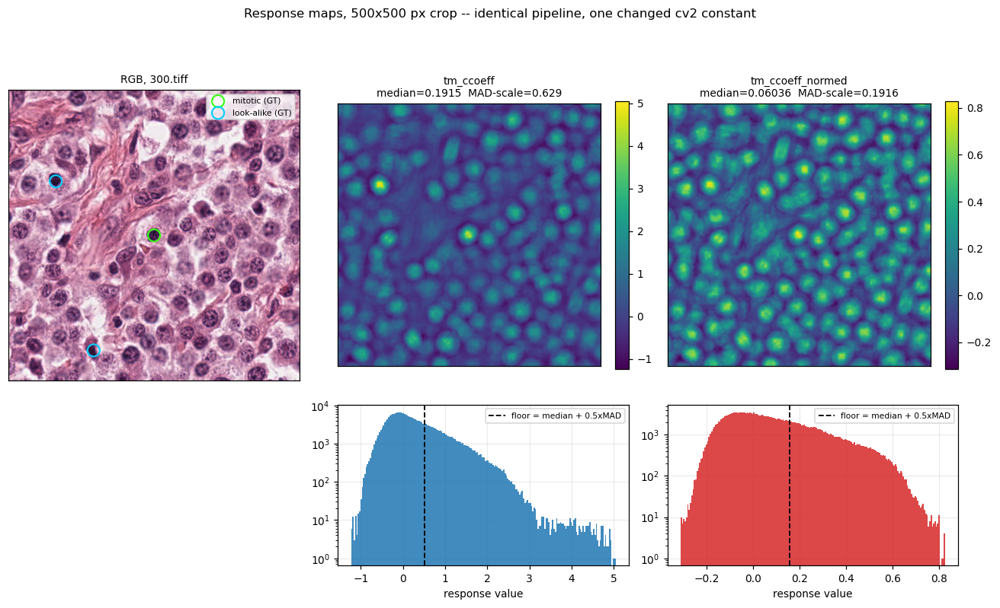

score ranges on this crop: tm_ccoeff: [-1.226, 5.04] | tm_ccoeff_normed: [-0.313, 0.827]
Orders of magnitude apart. Any fixed cutoff would silently mean a different search depth
for each arm, which is why the threshold is expressed in each map's own MAD units.


In [15]:
y0, y1, x0, x1 = DEMO_WIN
fig, axes = plt.subplots(2, 3, figsize=(12, 7.2),
                         gridspec_kw={"height_ratios": [2.4, 1]})
axes[0, 0].imshow(seed_rgb[y0:y1, x0:x1]); axes[0, 0].set_title(f"RGB, {RUN_ROIS[0]}", fontsize=9)
mit = ann[(ann["file_name"] == RUN_ROIS[0]) & (ann["category_id"] == ds.MITOTIC)]
lk = ann[(ann["file_name"] == RUN_ROIS[0]) & (ann["category_id"] == ds.LOOKALIKE)]
for df, col, lab in [(mit, "#39ff14", "mitotic (GT)"), (lk, "#00d0ff", "look-alike (GT)")]:
    s = df[(df.cx >= x0) & (df.cx < x1) & (df.cy >= y0) & (df.cy < y1)]
    axes[0, 0].scatter(s.cx - x0, s.cy - y0, s=110, facecolors="none", edgecolors=col,
                       lw=1.4, label=lab)
axes[0, 0].legend(fontsize=7, loc="upper right")
for j, name in enumerate(TM_ARMS):
    d = DEMO_MAPS[name]
    im = axes[0, j + 1].imshow(d["map"], cmap="viridis")
    plt.colorbar(im, ax=axes[0, j + 1], fraction=0.046)
    axes[0, j + 1].set_title(f"{name}\nmedian={d['median']:.4g}  MAD-scale={d['mad']:.4g}",
                             fontsize=9)
for a in axes[0]:
    a.set_xticks([]); a.set_yticks([]); a.grid(False)
axes[1, 0].axis("off")
for j, name in enumerate(TM_ARMS):
    d = DEMO_MAPS[name]
    axes[1, j + 1].hist(d["map"].ravel(), bins=200, color=ARM_COLOUR[name], alpha=0.85)
    axes[1, j + 1].axvline(d["floor"], color="k", ls="--", lw=1.2,
                           label=f"floor = median + {FLOOR_Z}xMAD")
    axes[1, j + 1].set_yscale("log"); axes[1, j + 1].legend(fontsize=7)
    axes[1, j + 1].set_xlabel("response value")
fig.suptitle(f"Response maps, {2*_HALF}x{2*_HALF} px crop -- identical pipeline, "
             "one changed cv2 constant", y=1.0)
fig.tight_layout(); plt.show()
print(f"score ranges on this crop: "
      + " | ".join(f"{n}: [{DEMO_MAPS[n]['map'].min():.4g}, {DEMO_MAPS[n]['map'].max():.4g}]"
                   for n in TM_ARMS))
print("Orders of magnitude apart. Any fixed cutoff would silently mean a different search "
      "depth\nfor each arm, which is why the threshold is expressed in each map's own MAD units.")
del seed_rgb, seed_hem

## 6. The sweep

One pass over every ROI. Per ROI the channel is computed once and the blob detector is run once
(it cannot see the click, so re-running it per seed would compute the same answer three times).
Per seed, each template-matching arm gets its own fused response map, its own per-map threshold,
its own peak extraction and its own suppression.

**Identical downstream treatment for all three arms**, which is what makes the comparison a
comparison:

1. suppression by `nms.nms_by_distance` at **that image's** match radius (29.6-33.1 px, never a
   constant);
2. drop any candidate within 5 px of the click -- the clicked cell is not a discovery, and this
   applies to the blob arm too even though it never saw the click;
3. score against `evaluate.bucket_detections` -- greedy, score-ordered, one-to-one, within the
   match radius, against ground truth **with the seed annotation removed** and with both
   categories pooled so one detection cannot claim a mitotic figure and a look-alike at once.

Two assertions fail the run loudly rather than let it produce numbers:

* **`MAD > 0`.** If a response map's MAD collapses, `median + 0.5 x MAD` lands on the median,
  millions of tied pixels pass, and the candidate list becomes an artefact of tie-ordering.
  This is the failure that invalidated `TM_SQDIFF_NORMED` in the prior work. It should not
  affect either CCOEFF arm; it is asserted regardless.
* **the peak cap never binds.** If `extract_peaks` returns exactly `MAX_PEAKS`, the list is a
  truncation of the score order rather than everything above the floor. The prior work applied
  its cap check to the *post-NMS* length, which is not the quantity that binds, and 228 capped
  rows passed all 4,257 checks as a result.

In [16]:
class DegenerateMapError(RuntimeError):
    pass

def eval_arm(centres, scores, gt_eval, radius, shape, n_matched, seed_xy):
    '''Score one arm's ranked list. Returns a record + the retained head of the list.'''
    det = pd.DataFrame({"cx": centres[:, 0], "cy": centres[:, 1], "score": scores}) \
        if len(centres) else pd.DataFrame(columns=["cx", "cy", "score"], dtype=float)
    det_b, gt_b = ev.bucket_detections(det, gt_eval, radius)
    is_mit = gt_b["category_id"].to_numpy() == ds.MITOTIC
    mit_rank = gt_b.loc[is_mit, "matched_rank"].to_numpy()
    lk_rank = gt_b.loc[~is_mit, "matched_rank"].to_numpy()
    mit_ann = gt_b.loc[is_mit, "ann_id"].to_numpy()
    xy = det[["cx", "cy"]].to_numpy()

    # residual seed contamination: FPs still sitting on the clicked cell after the 5 px drop
    near_seed = 0
    if seed_xy is not None and len(xy):
        head = xy[:K_BUDGET]
        near_seed = int((np.hypot(head[:, 0] - seed_xy[0], head[:, 1] - seed_xy[1])
                         <= radius).sum())

    rec = {
        "n_pool": len(det),
        "mit_rank": mit_rank, "lk_rank": lk_rank, "mit_ann": mit_ann,
        "n_mit_eval": int(is_mit.sum()), "n_lk_eval": int((~is_mit).sum()),
        "coverage_full": ev.coverage_fraction(xy, shape, radius) if len(xy) else 0.0,
        "coverage_matched": (ev.coverage_fraction(xy[:n_matched], shape, radius)
                             if len(xy) else 0.0),
        "fp_near_seed_at_budget": near_seed,
    }
    keep = det_b.head(TOPN_RETAIN).copy()
    keep["rank"] = np.arange(len(keep))
    return rec, keep

def tm_pool(hem, templates, method, radius, seed_xy, arm_name, fn):
    fused, _, valid = tm.fused_response(hem, templates, method=method)
    med, mad = tm.robust_stats(fused, valid)
    if not np.isfinite(mad) or mad <= 0:
        raise DegenerateMapError(
            f"{fn} / {arm_name}: response map MAD={mad} (median={med}). The extraction floor "
            "collapses onto the median and any pool built from it is a tie-break artefact.")
    floor = med + FLOOR_Z * mad
    n_reachable = int(valid.sum())
    n_above = int(((fused >= floor) & valid).sum())
    centres, scores, n_peaks, n_self = extract_pool(fused, valid, radius, seed_xy, floor)
    if n_peaks >= MAX_PEAKS:
        raise DegenerateMapError(
            f"{fn} / {arm_name}: extract_peaks returned exactly MAX_PEAKS={MAX_PEAKS}, so the "
            "candidate list is a truncation of the score ordering, not everything above the "
            "floor. Do not report this arm.")
    diag = {"map_median": med, "mad_scale": mad, "extract_floor": floor,
            "n_reachable_px": n_reachable, "n_above_floor_px": n_above,
            "n_peaks": n_peaks, "n_self_dropped": n_self}
    del fused, valid
    return centres, scores, diag

In [17]:
def drop_self(centres, scores, seed_xy):
    if seed_xy is None or not len(centres):
        return centres, scores, 0
    ok = np.hypot(centres[:, 0] - seed_xy[0], centres[:, 1] - seed_xy[1]) > SELF_HIT_RADIUS
    return centres[ok], scores[ok], int((~ok).sum())

CELLS, RETAIN, DIAGS, ROI_TIME = [], {}, [], []
t_run0 = time.perf_counter()

for i_roi, fn in enumerate(RUN_ROIS):
    t_roi = time.perf_counter()
    r_meta = roi.loc[roi["file_name"] == fn].iloc[0]
    radius = float(r_meta["match_radius_px"])

    t0 = time.perf_counter(); rgb = ds.load_roi(IMAGES / fn); t_load = time.perf_counter() - t0
    t0 = time.perf_counter(); hem = cm.hematoxylin_od(rgb); t_chan = time.perf_counter() - t0
    shape = hem.shape

    # --- the seedless arm: computed ONCE, it cannot see the click ---------------------------
    t0 = time.perf_counter()
    blobs = bl.nucleus_blobs(rgb)                       # max_detections=None: no truncation
    b_xy = blobs[["cx", "cy"]].to_numpy(); b_s = blobs["score"].to_numpy()
    b_keep = nms_by_distance(b_xy, b_s, radius)
    blob_xy, blob_s = b_xy[b_keep], b_s[b_keep]
    t_blob = time.perf_counter() - t0
    del rgb

    gt_img = ann[ann["file_name"] == fn]
    g_mit = gt_img[gt_img["category_id"] == ds.MITOTIC]
    pool_e, flagged = ss.agreement_pool(g_mit)
    pool_e = ss.border_filter(pool_e, PATCH_SIZE // 2, shape)

    remaining, t_tm = pool_e, 0.0
    for s_idx in range(N_SEEDS):
        if not len(remaining):
            break
        rng = np.random.default_rng([s_idx, int(r_meta["image_id"])])
        j = int(rng.integers(len(remaining)))
        srow = remaining.iloc[j]; remaining = remaining.drop(remaining.index[j])
        seed_xy = (float(srow["cx"]), float(srow["cy"]))
        gt_eval = gt_img[gt_img["ann_id"] != int(srow["ann_id"])].reset_index(drop=True)

        patch = tm.read_padded_patch(hem, seed_xy[0], seed_xy[1], PATCH_SIZE)
        assert patch is not None, f"{fn} seed {s_idx}: border filter let through an unreadable patch"
        tpls, _ = tm.build_augmentations(patch, BASE_SIZE, SCALES, N_ANGLES, FLIPS)

        lists, diags = {}, {}
        for arm, meth in METHODS.items():
            t0 = time.perf_counter()
            c, sc, dg = tm_pool(hem, tpls, meth, radius, seed_xy, arm, fn)
            t_tm += time.perf_counter() - t0
            lists[arm] = (c, sc); diags[arm] = dg
        bc, bs_, n_bself = drop_self(blob_xy, blob_s, seed_xy)
        lists["blob"] = (bc, bs_)
        diags["blob"] = {"n_peaks": len(blob_xy), "n_self_dropped": n_bself,
                         "n_components_raw": len(blobs)}
        rc, rs_, n_rself = drop_self(b_xy, b_s, seed_xy)
        lists["blob_raw"] = (rc, rs_)
        diags["blob_raw"] = {"n_peaks": len(b_xy), "n_self_dropped": n_rself}

        # matched length: the shortest of the THREE compared arms (blob_raw excluded)
        lens = {a: len(lists[a][0]) for a in ARMS}
        n_matched = min(lens.values())
        matched_by = min(lens, key=lens.get)

        for arm in ALL_ARMS:
            c, sc = lists[arm]
            rec, head = eval_arm(c, sc, gt_eval, radius, shape, n_matched, seed_xy)
            rec.update({"file_name": fn, "tumor_type": r_meta["tumor_type"], "seed_index": s_idx,
                        "seed_ann_id": int(srow["ann_id"]), "arm": arm, "radius_px": radius,
                        "n_matched": n_matched, "matched_by": matched_by,
                        "n_seeds_this_roi": min(N_SEEDS, len(pool_e)),
                        "no_unanimous": bool(flagged),
                        "roi_area_mm2": float(r_meta["roi_area_mm2"])})
            CELLS.append(rec)
            RETAIN[(fn, s_idx, arm)] = head
            DIAGS.append({"file_name": fn, "seed_index": s_idx, "arm": arm, **diags[arm],
                          "n_after_nms_and_self": len(c)})
    del hem, blobs
    dt = time.perf_counter() - t_roi
    ROI_TIME.append({"file_name": fn, "load_s": round(t_load, 1), "channel_s": round(t_chan, 1),
                     "blob_s": round(t_blob, 1), "tm_s": round(t_tm, 1), "total_s": round(dt, 1)})
    print(f"[{i_roi+1:2d}/{len(RUN_ROIS)}] {fn:10s} {r_meta['tumor_type'][:26]:28s} "
          f"load {t_load:4.1f}s  channel {t_chan:4.1f}s  blob {t_blob:5.1f}s  tm {t_tm:6.1f}s  "
          f"| roi {dt:6.1f}s  cumulative {(time.perf_counter()-t_run0)/60:5.1f} min")

cells = pd.DataFrame(CELLS)
diags = pd.DataFrame(DIAGS)
tdf = pd.DataFrame(ROI_TIME)
print(f"\nSWEEP COMPLETE in {(time.perf_counter()-t_run0)/60:.1f} min -- "
      f"{cells['file_name'].nunique()} ROIs, "
      f"{cells.groupby(['file_name','seed_index']).ngroups} (ROI, seed) cells, {len(ARMS)} "
      f"compared arms + blob_raw")

[ 1/17] 300.tiff   canine cutaneous mast cell   load  0.4s  channel  2.4s  blob  12.4s  tm   77.1s  | roi   98.2s  cumulative   1.6 min


[ 2/17] 301.tiff   canine cutaneous mast cell   load  0.4s  channel  2.4s  blob  11.1s  tm  151.6s  | roi  177.8s  cumulative   4.6 min


[ 3/17] 201.tiff   canine lung cancer           load  0.9s  channel  4.5s  blob  21.3s  tm  199.3s  | roi  241.7s  cumulative   8.6 min


[ 4/17] 202.tiff   canine lung cancer           load  1.0s  channel  6.1s  blob  29.4s  tm  209.2s  | roi  261.8s  cumulative  13.0 min


[ 5/17] 245.tiff   canine lymphosarcoma         load  1.2s  channel  8.2s  blob  49.1s  tm   83.9s  | roi  147.9s  cumulative  15.5 min


[ 6/17] 246.tiff   canine lymphosarcoma         load  0.3s  channel  1.8s  blob  12.5s  tm   64.6s  | roi   84.6s  cumulative  16.9 min


[ 7/17] 405.tiff   canine soft tissue sarcoma   load  0.4s  channel  2.2s  blob   6.1s  tm   60.0s  | roi   72.8s  cumulative  18.1 min


[ 8/17] 406.tiff   canine soft tissue sarcoma   load  0.3s  channel  1.9s  blob   9.6s  tm   72.9s  | roi   89.9s  cumulative  19.6 min


[ 9/17] 459.tiff   canine soft tissue sarcoma   load  0.4s  channel  1.9s  blob   9.7s  tm   57.9s  | roi   74.2s  cumulative  20.8 min


[10/17] 002.tiff   human breast cancer          load  0.4s  channel  3.1s  blob   9.7s  tm   83.8s  | roi  102.7s  cumulative  22.5 min


[11/17] 094.tiff   human breast cancer          load  0.4s  channel  2.4s  blob   9.5s  tm   69.6s  | roi   86.9s  cumulative  24.0 min


[12/17] 505.tiff   human melanoma               load  1.1s  channel  2.4s  blob   8.1s  tm   59.6s  | roi   74.8s  cumulative  25.2 min


[13/17] 506.tiff   human melanoma               load  1.1s  channel  2.4s  blob   7.5s  tm   69.7s  | roi   85.4s  cumulative  26.6 min


[14/17] 548.tiff   human melanoma               load  1.1s  channel  2.2s  blob   9.3s  tm   73.0s  | roi   91.6s  cumulative  28.2 min


[15/17] 350.tiff   human neuroendocrine tumor   load  0.4s  channel  2.1s  blob   8.2s  tm   79.0s  | roi   95.5s  cumulative  29.8 min


[16/17] 351.tiff   human neuroendocrine tumor   load  0.4s  channel  2.4s  blob   8.9s  tm   78.2s  | roi   96.0s  cumulative  31.4 min


[17/17] 402.tiff   human neuroendocrine tumor   load  0.4s  channel  2.3s  blob  10.3s  tm   74.7s  | roi   93.6s  cumulative  32.9 min

SWEEP COMPLETE in 32.9 min -- 17 ROIs, 50 (ROI, seed) cells, 3 compared arms + blob_raw


In [18]:
print("Wall clock by stage, summed over all ROIs (seconds):")
tot = tdf[["load_s", "channel_s", "blob_s", "tm_s", "total_s"]].sum()
display(tot.to_frame("seconds").assign(pct=lambda d: (100 * d.seconds / tot["total_s"]).round(1)))
print("\nPer ROI:")
display(tdf.merge(roi[["file_name", "tumor_type", "n_mitotic"]], on="file_name")
        .sort_values("total_s", ascending=False))
print("\nVerification-only compute (sections 3-5), seconds:",
      {k: round(v, 1) for k, v in TIMINGS.items()})

Wall clock by stage, summed over all ROIs (seconds):


,seconds,pct
load_s,10.6,0.5
channel_s,50.7,2.6
blob_s,232.7,11.8
tm_s,1564.1,79.2
total_s,1975.4,100.0



Per ROI:


,file_name,load_s,channel_s,blob_s,tm_s,total_s,tumor_type,n_mitotic
3,202.tiff,1.0,6.1,29.4,209.2,261.8,canine lung cancer,16
2,201.tiff,0.9,4.5,21.3,199.3,241.7,canine lung cancer,18
1,301.tiff,0.4,2.4,11.1,151.6,177.8,canine cutaneous mast cell tumor,218
4,245.tiff,1.2,8.2,49.1,83.9,147.9,canine lymphosarcoma,90
9,002.tiff,0.4,3.1,9.7,83.8,102.7,human breast cancer,9
0,300.tiff,0.4,2.4,12.4,77.1,98.2,canine cutaneous mast cell tumor,181
15,351.tiff,0.4,2.4,8.9,78.2,96.0,human neuroendocrine tumor,4
14,350.tiff,0.4,2.1,8.2,79.0,95.5,human neuroendocrine tumor,4
16,402.tiff,0.4,2.3,10.3,74.7,93.6,human neuroendocrine tumor,105
13,548.tiff,1.1,2.2,9.3,73.0,91.6,human melanoma,239



Verification-only compute (sections 3-5), seconds: {'verify': 51.5, 'preproc_fig': 47.2}


### 6.1 The two loud assertions, after the fact

Both are re-checked here across every cell that ran, so a pass is a statement about the whole
sweep and not only about the ROI a gate happened to visit.

In [19]:
tm_d = diags[diags["arm"].isin(TM_ARMS)]
bad_mad = tm_d[~(tm_d["mad_scale"] > 0) | ~np.isfinite(tm_d["mad_scale"])]
bad_cap = tm_d[tm_d["n_peaks"] >= MAX_PEAKS]
assert len(bad_mad) == 0, f"degenerate response map:\n{bad_mad}"
assert len(bad_cap) == 0, f"peak cap bound:\n{bad_cap}"
print(f"PASS  MAD > 0 on all {len(tm_d)} template-matching cells "
      f"(min MAD-scale {tm_d['mad_scale'].min():.6g})")
print(f"PASS  peak cap never bound: max n_peaks {tm_d['n_peaks'].max():,} vs MAX_PEAKS "
      f"{MAX_PEAKS:,} ({100*tm_d['n_peaks'].max()/MAX_PEAKS:.1f}% of the cap)")

sd = diags.groupby("arm")["n_self_dropped"].agg(["min", "max", "mean"]).round(2)
print("\nSelf-match candidates dropped (the click itself, within 5 px):")
display(sd)
ns = cells.groupby("arm")["fp_near_seed_at_budget"].agg(["max", "mean"]).round(3)
print(f"Residual: candidates in the top {K_BUDGET} still within a MATCH RADIUS of the click.\n"
      "The 5 px rule removes the click's own peak; a blob centroid offset from the click by\n"
      "more than 5 px can survive it. This is the size of that residual, per arm:")
display(ns)

PASS  MAD > 0 on all 100 template-matching cells (min MAD-scale 0.0674136)
PASS  peak cap never bound: max n_peaks 85,484 vs MAX_PEAKS 500,000 (17.1% of the cap)

Self-match candidates dropped (the click itself, within 5 px):


,min,max,mean
arm,,,
blob,0,1,0.70
blob_raw,0,1,0.72
tm_ccoeff,1,1,1.00
tm_ccoeff_normed,1,1,1.00


Residual: candidates in the top 100 still within a MATCH RADIUS of the click.
The 5 px rule removes the click's own peak; a blob centroid offset from the click by
more than 5 px can survive it. This is the size of that residual, per arm:


,max,mean
arm,,
blob,0,0.0
blob_raw,0,0.0
tm_ccoeff,0,0.0
tm_ccoeff_normed,0,0.0


### 6.2 Which arm sets the matched length

"Truncate every arm to a common list length" is only meaningful if you say which arm's pool is
the short one, because that arm is the one imposing the budget on the others. In the prior work
a single degenerate arm silently truncated every other arm in the same cell, and every
`@matched` number in that CSV is partly a consequence of it.

In [20]:
mt = (cells[cells["arm"] == "blob"]
      .groupby(["file_name", "matched_by"]).size().rename("n_cells").reset_index()
      .pivot(index="file_name", columns="matched_by", values="n_cells").fillna(0).astype(int))
display(mt)
print("cells by the arm that set n_matched:")
print(cells[cells["arm"] == "blob"]["matched_by"].value_counts().to_string())
ln = (cells[cells["arm"].isin(ALL_ARMS)].groupby("arm")["n_pool"]
      .agg(["min", "median", "max"]).astype(int))
print("\nfinal ranked-list length per arm, across all cells:")
display(ln)

matched_by,blob
file_name,
002.tiff,3
094.tiff,3
201.tiff,3
202.tiff,3
245.tiff,3
246.tiff,3
300.tiff,3
301.tiff,3
350.tiff,3


cells by the arm that set n_matched:
matched_by
blob    50

final ranked-list length per arm, across all cells:


,min,median,max
arm,,,
blob,5214,10003,15927
blob_raw,6923,12665,34910
tm_ccoeff,7950,13932,18882
tm_ccoeff_normed,11483,16330,18950


## 7. The funnel: how many locations survive each stage

One ROI, one seed, all three arms. The two pipelines are structurally different at the front --
one thresholds a correlation map, the other segments connected components -- and identical from
suppression onward. This is where the shapes of the two candidate generators become visible.

In [21]:
from skimage.measure import label, regionprops
FUNNEL_ROI = cells.loc[cells["arm"] == "blob"].groupby("file_name")["n_mit_eval"].first() \
    .sort_values(ascending=False).index[0]
radius = float(roi.loc[roi["file_name"] == FUNNEL_ROI, "match_radius_px"].iloc[0])
print(f"funnel ROI: {FUNNEL_ROI} ({roi.loc[roi.file_name==FUNNEL_ROI,'tumor_type'].iloc[0]}), "
      f"seed 0, match radius {radius:.1f} px")

rgb = ds.load_roi(IMAGES / FUNNEL_ROI); hem = cm.hematoxylin_od(rgb)
d0 = diags[(diags["file_name"] == FUNNEL_ROI) & (diags["seed_index"] == 0)].set_index("arm")

# blob internals, recomputed explicitly so each stage can be counted
tmask = bl.tissue_mask(rgb)
hclip = ch.to_hematoxylin(rgb)                       # nucleus_blobs' own channel
thr = bl._tiled_otsu_threshold(hclip, tmask, 512)
binary = (hclip > thr) & tmask
lab = label(binary, connectivity=2)
props = regionprops(lab, intensity_image=hclip)
n_comp_all = len(props)
n_comp_area = sum(1 for p in props if 80 <= p.area <= 4000)   # nucleus_blobs' area filter

funnel = {
    "tm_ccoeff": [("reachable pixels", int(d0.loc["tm_ccoeff", "n_reachable_px"])),
                  ("above threshold", int(d0.loc["tm_ccoeff", "n_above_floor_px"])),
                  ("local peaks", int(d0.loc["tm_ccoeff", "n_peaks"])),
                  ("after suppression", int(d0.loc["tm_ccoeff", "n_after_nms_and_self"]
                                            + d0.loc["tm_ccoeff", "n_self_dropped"])),
                  ("final list", int(d0.loc["tm_ccoeff", "n_after_nms_and_self"]))],
    "tm_ccoeff_normed": [("reachable pixels", int(d0.loc["tm_ccoeff_normed", "n_reachable_px"])),
                  ("above threshold", int(d0.loc["tm_ccoeff_normed", "n_above_floor_px"])),
                  ("local peaks", int(d0.loc["tm_ccoeff_normed", "n_peaks"])),
                  ("after suppression", int(d0.loc["tm_ccoeff_normed", "n_after_nms_and_self"]
                                            + d0.loc["tm_ccoeff_normed", "n_self_dropped"])),
                  ("final list", int(d0.loc["tm_ccoeff_normed", "n_after_nms_and_self"]))],
    "blob": [("reachable pixels", int(tmask.sum())),
             ("above threshold", int(binary.sum())),
             ("local peaks", n_comp_area),
             ("after suppression", int(d0.loc["blob", "n_after_nms_and_self"]
                                       + d0.loc["blob", "n_self_dropped"])),
             ("final list", int(d0.loc["blob", "n_after_nms_and_self"]))],
}
stage_names = {"tm_ccoeff": ["pixels any template reaches", "pixels >= median+0.5MAD",
                             "grey-dilation local maxima", "after distance NMS", "after self-hit drop"],
               "blob": ["pixels inside the tissue mask", "pixels above tiled-Otsu",
                        "components passing the area filter", "after distance NMS",
                        "after self-hit drop"]}
ft = pd.DataFrame({a: dict(v) for a, v in funnel.items()})
ft = ft.loc[["reachable pixels", "above threshold", "local peaks", "after suppression",
             "final list"]]
ft.insert(0, "what it means (TM / blob)",
          [f"{a}  /  {b}" for a, b in zip(stage_names["tm_ccoeff"], stage_names["blob"])])
display(ft)
print(f"components before the 80-4000 px area filter: {n_comp_all:,} -> {n_comp_area:,} after "
      f"({100*(1-n_comp_area/max(n_comp_all,1)):.1f}% removed)")
print("The blob arm's area filter is a pair of untuned constants (min_area=80, max_area=4000)\n"
      "with no ground truth available at inference time to set them. The click supplies the\n"
      "template's size and stain intensity for free -- that asymmetry is not visible in any\n"
      "recall number and is worth carrying into the reading of section 8.")

funnel ROI: 548.tiff (human melanoma), seed 0, match radius 33.0 px


,what it means (TM / blob),tm_ccoeff,tm_ccoeff_normed,blob
reachable pixels,pixels any template reaches / pixels inside ...,38418730,38418730,39044907
above threshold,pixels >= median+0.5MAD / pixels above tiled...,12980446,12472010,10374144
local peaks,grey-dilation local maxima / components pass...,20909,23527,12294
after suppression,after distance NMS / after distance NMS,14446,16280,10195
final list,after self-hit drop / after self-hit drop,14445,16279,10194


components before the 80-4000 px area filter: 62,326 -> 12,294 after (80.3% removed)
The blob arm's area filter is a pair of untuned constants (min_area=80, max_area=4000)
with no ground truth available at inference time to set them. The click supplies the
template's size and stain intensity for free -- that asymmetry is not visible in any
recall number and is worth carrying into the reading of section 8.


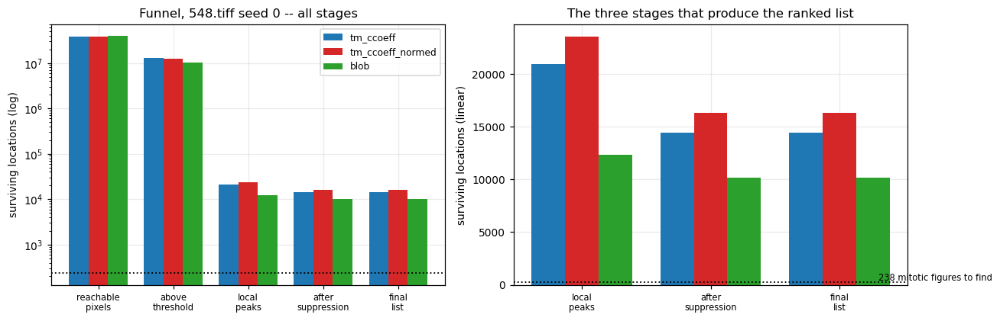

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(12, 3.9))
stages = list(ft.index)
xs = np.arange(len(stages)); wdt = 0.26
for k, a in enumerate(ARMS):
    axes[0].bar(xs + (k - 1) * wdt, [funnel[a][i][1] for i in range(len(stages))], wdt,
                label=a, color=ARM_COLOUR[a])
axes[0].set_yscale("log"); axes[0].set_xticks(xs)
axes[0].set_xticklabels([s.replace(" ", "\n") for s in stages], fontsize=7.5)
axes[0].set_ylabel("surviving locations (log)"); axes[0].legend(fontsize=8)
axes[0].set_title(f"Funnel, {FUNNEL_ROI} seed 0 -- all stages")
for k, a in enumerate(ARMS):
    v = [funnel[a][i][1] for i in range(2, len(stages))]
    axes[1].bar(np.arange(len(v)) + (k - 1) * wdt, v, wdt, label=a, color=ARM_COLOUR[a])
axes[1].set_xticks(np.arange(3)); axes[1].set_xticklabels(
    [s.replace(" ", "\n") for s in stages[2:]], fontsize=7.5)
axes[1].set_ylabel("surviving locations (linear)")
axes[1].set_title("The three stages that produce the ranked list")
n_mit = int(cells[(cells.file_name == FUNNEL_ROI) & (cells.seed_index == 0)
                  & (cells.arm == "blob")]["n_mit_eval"].iloc[0])
for ax in axes:
    ax.axhline(n_mit, color="k", ls=":", lw=1.2)
axes[1].annotate(f"{n_mit} mitotic figures to find", (2.3, n_mit), fontsize=7.5, va="bottom")
fig.tight_layout(); plt.show()
del rgb, hem, tmask, hclip, thr, binary, lab, props

## 8. Quantitative comparison

### Aggregation convention -- applies to every table and figure in this section

> A **cell** is one (ROI, seed, arm). Cell values are averaged over seeds **within** an ROI, and
> ROI values are then averaged with **equal weight per ROI** (a macro average). An ROI with 239
> mitotic figures therefore counts exactly as much as one with 4. The alternative -- pooling all
> annotations -- would let the three densest ROIs decide every headline, and is reported
> separately where it changes the answer.
>
> Seeds are averaged, **not** taken worst-of-N. Worst-of-N is defensible as a product-risk
> statistic, but it structurally penalises the seeded arms: the blob arm's candidate list does
> not change with the seed at all, so its "worst seed" varies only through the evaluation ground
> truth. The prior work used worst-of-N as its headline without stating that asymmetry.

In [23]:
def recall_at(mit_rank, K):
    r = np.asarray(mit_rank)
    return float(((r >= 0) & (r < K)).mean()) if r.size else np.nan

def ceiling(mit_rank, K=None):
    r = np.asarray(mit_rank)
    if not r.size:
        return np.nan
    return float((r >= 0).mean()) if K is None else recall_at(r, K)

def depth_for(mit_rank, frac):
    '''Candidates that must be read to reach `frac` of the mitotic figures. NaN if unreached.'''
    r = np.asarray(mit_rank)
    if not r.size:
        return np.nan
    need = int(np.ceil(frac * r.size))
    found = np.sort(r[r >= 0])
    return float(found[need - 1] + 1) if len(found) >= need else np.nan

def fp_split(row, K):
    m = np.asarray(row["mit_rank"]); l = np.asarray(row["lk_rank"])
    n_read = min(K, int(row["n_pool"]))
    hit_m = int(((m >= 0) & (m < K)).sum()); hit_l = int(((l >= 0) & (l < K)).sum())
    return pd.Series({"n_read": n_read, "tp_mitotic": hit_m, "fp_lookalike": hit_l,
                      "fp_unannotated": n_read - hit_m - hit_l})

M = cells.copy()
for K in K_GRID:
    M[f"recall@{K}"] = M["mit_rank"].map(lambda r, K=K: recall_at(r, K))
M["recall@budget"] = M["mit_rank"].map(lambda r: recall_at(r, K_BUDGET))
M["ceiling_full"] = M["mit_rank"].map(ceiling)
M["ceiling_matched"] = [ceiling(r, int(n)) for r, n in zip(M["mit_rank"], M["n_matched"])]
for f in DEPTH_TARGETS:
    M[f"read_{int(f*100)}"] = M["mit_rank"].map(lambda r, f=f: depth_for(r, f))
M = pd.concat([M, M.apply(lambda r: fp_split(r, K_BUDGET), axis=1)], axis=1)

def macro(df, cols, by="arm"):
    '''Mean over seeds within ROI, then mean over ROIs -- the stated convention.'''
    per_roi = df.groupby([by, "file_name"])[cols].mean()
    return per_roi.groupby(by).mean()

print(f"{len(M)} cells | {M['file_name'].nunique()} ROIs | metrics computed")

200 cells | 17 ROIs | metrics computed


### 8.1 Sensitivity at a reading budget

The product question in its most direct form: *of the mitotic figures in this ROI, how many are
in the first K locations the pathologist is asked to look at?* No threshold is involved -- K is
the budget.

,K=25,K=50,K=100,K=250,K=500,K=1000,K=2500,K=5000
arm,,,,,,,,
blob,16.7,24.2,37.1,52.0,67.2,78.7,89.7,94.4
blob_raw,16.7,24.2,37.0,51.6,63.7,77.4,89.5,94.3
tm_ccoeff,23.1,34.9,47.0,62.7,75.6,84.5,91.0,94.9
tm_ccoeff_normed,8.7,13.5,19.6,29.8,40.8,55.5,73.8,89.2


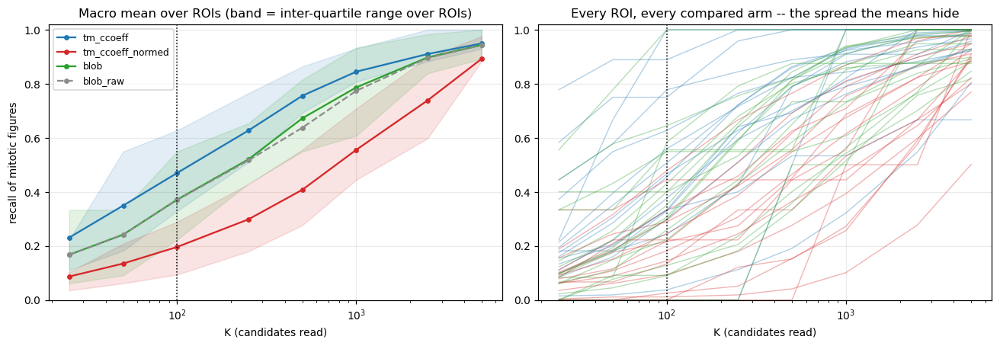

In [24]:
cols = [f"recall@{K}" for K in K_GRID]
curve = macro(M[M["arm"].isin(ALL_ARMS)], cols)
display((curve * 100).round(1).rename(columns=lambda c: c.replace("recall@", "K=")))

fig, axes = plt.subplots(1, 2, figsize=(12, 4.2))
for a in ALL_ARMS:
    per_roi = M[M["arm"] == a].groupby(["file_name"])[cols].mean()
    y = per_roi.mean().to_numpy(); lo = per_roi.quantile(0.25).to_numpy()
    hi = per_roi.quantile(0.75).to_numpy()
    ls = "--" if a == "blob_raw" else "-"
    axes[0].plot(K_GRID, y, ls, marker="o", ms=3.5, color=ARM_COLOUR[a], label=a)
    if a != "blob_raw":
        axes[0].fill_between(K_GRID, lo, hi, color=ARM_COLOUR[a], alpha=0.13)
axes[0].set_xscale("log"); axes[0].set_xlabel("K (candidates read)")
axes[0].set_ylabel("recall of mitotic figures")
axes[0].set_title("Macro mean over ROIs (band = inter-quartile range over ROIs)")
axes[0].legend(fontsize=8); axes[0].set_ylim(0, 1.02)
axes[0].axvline(K_BUDGET, color="k", ls=":", lw=1)

for a in ARMS:
    per_roi = M[M["arm"] == a].groupby(["file_name"])[cols].mean()
    for fn in per_roi.index:
        axes[1].plot(K_GRID, per_roi.loc[fn], color=ARM_COLOUR[a], alpha=0.35, lw=0.9)
axes[1].set_xscale("log"); axes[1].set_xlabel("K (candidates read)")
axes[1].set_title("Every ROI, every compared arm -- the spread the means hide")
axes[1].set_ylim(0, 1.02); axes[1].axvline(K_BUDGET, color="k", ls=":", lw=1)
fig.tight_layout(); plt.show()

In [25]:
print(f"Per-ROI recall at the fixed reading budget K={K_BUDGET} "
      "(mean over that ROI's seeds; n_seeds shown because they are not all equal):")
tb = (M[M["arm"].isin(ARMS)].pivot_table(index=["tumor_type", "file_name"], columns="arm",
                                         values="recall@budget", aggfunc="mean") * 100).round(1)
ns = M[M["arm"] == "blob"].groupby(["tumor_type", "file_name"]).agg(
    n_seeds=("seed_index", "nunique"), n_mit_eval=("n_mit_eval", "first"))
display(ns.join(tb))

Per-ROI recall at the fixed reading budget K=100 (mean over that ROI's seeds; n_seeds shown because they are not all equal):


n_seeds  n_mit_eval   blob  tm_ccoeff  tm_ccoeff_normed
tumor_type                       file_name                                                         
canine cutaneous mast cell tumor 300.tiff         3         180   40.0       37.6              14.4
                                 301.tiff         3         217   35.0       30.0               9.4
canine lung cancer               201.tiff         3          17   54.9       62.7              21.6
                                 202.tiff         3          15   64.4       77.8              28.9
canine lymphosarcoma             245.tiff         3          89    9.0        3.7               1.1
                                 246.tiff         3         115   30.7       50.7              47.8
canine soft tissue sarcoma       405.tiff         3          13   12.8       33.3               2.6
                                 406.tiff         3           5   40.0       33.3              13.3
                                 459.tiff         3         130   22.3       46.7              24.6
human breast cancer              002.tiff         3           8   58.3       75.0              33.3
                                 094.tiff         3          81   25.9       56.0              21.8
human melanoma                   505.tiff         2           1    0.0        0.0               0.0
                                 506.tiff         3          11    9.1       24.2               0.0
                                 548.tiff         3         238   29.8       32.9              18.2
human neuroendocrine tumor       350.tiff         3           3   55.6      100.0              22.2
                                 351.tiff         3           3  100.0       88.9              44.4
                                 402.tiff         3         104   42.9       45.5              29.5

### 8.2 Total recall (the ceiling) -- and why it must never be read alone

"Fraction of mitotic figures found *anywhere* in the list" is the most flattering number any of
these arms can produce, and on its own it is close to meaningless. A detection counts as finding
an annotation if it lands within ~30 px of it. A list long enough to tile the ROI at that
spacing therefore "finds" annotations by geometry rather than by detection.

`evaluate.coverage_fraction` is the check: the fraction of *arbitrary* ROI locations that are
already within a match radius of some candidate. When coverage approaches 1.0, a ceiling near
1.0 says nothing about the detector. It is printed beside every ceiling number below, and the
ceiling is reported both at full list length and at **matched** length, because the arms' raw
pools differ in size.

In [26]:
cols = ["ceiling_full", "coverage_full", "ceiling_matched", "coverage_matched", "n_pool",
        "n_matched"]
cl = macro(M[M["arm"].isin(ALL_ARMS)], cols)
out = pd.DataFrame({
    "ceiling @ full list": (cl["ceiling_full"] * 100).round(1),
    "coverage @ full list": cl["coverage_full"].round(3),
    "median list length": M[M["arm"].isin(ALL_ARMS)].groupby("arm")["n_pool"].median().astype(int),
    "ceiling @ matched": (cl["ceiling_matched"] * 100).round(1),
    "coverage @ matched": cl["coverage_matched"].round(3),
})
display(out.loc[list(ALL_ARMS)])
print(f"Coverage is the number to read first. At these list lengths, "
      f"{out['coverage @ full list'].min():.0%}-{out['coverage @ full list'].max():.0%} of "
      "arbitrary\nROI locations already sit within a match radius of some candidate. Ceiling "
      "differences at\nfull length are therefore differences between two near-exhaustive tilings, "
      "not between two\ndetectors. The matched-length column is the comparable one.")

,ceiling @ full list,coverage @ full list,median list length,ceiling @ matched,coverage @ matched
arm,,,,,
tm_ccoeff,99.3,0.846,13932,98.8,0.670
tm_ccoeff_normed,98.4,0.928,16330,96.9,0.684
blob,96.0,0.680,10003,96.0,0.680
blob_raw,96.3,0.727,12665,95.9,0.616


Coverage is the number to read first. At these list lengths, 68%-93% of arbitrary
ROI locations already sit within a match radius of some candidate. Ceiling differences at
full length are therefore differences between two near-exhaustive tilings, not between two
detectors. The matched-length column is the comparable one.


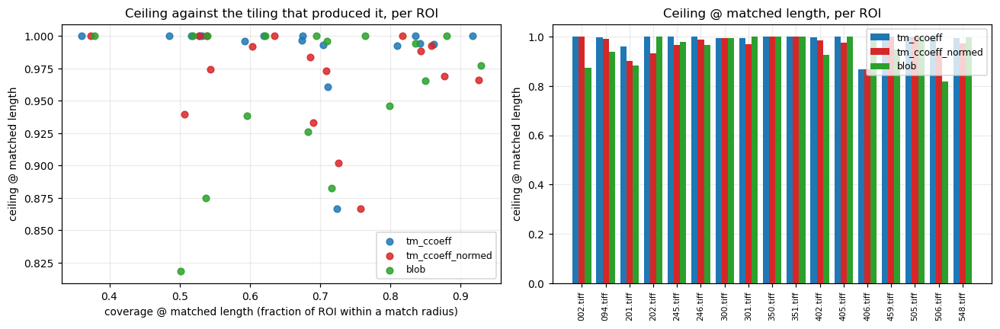

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4.0))
per_roi_c = M[M["arm"].isin(ARMS)].groupby(["arm", "file_name"])[
    ["ceiling_matched", "coverage_matched"]].mean().reset_index()
for a in ARMS:
    d = per_roi_c[per_roi_c["arm"] == a]
    axes[0].scatter(d["coverage_matched"], d["ceiling_matched"], color=ARM_COLOUR[a], label=a,
                    s=32, alpha=0.85)
axes[0].set_xlabel("coverage @ matched length (fraction of ROI within a match radius)")
axes[0].set_ylabel("ceiling @ matched length"); axes[0].legend(fontsize=8)
axes[0].set_title("Ceiling against the tiling that produced it, per ROI")
w = 0.26; fns = sorted(per_roi_c["file_name"].unique())
xs = np.arange(len(fns))
for k, a in enumerate(ARMS):
    d = per_roi_c[per_roi_c["arm"] == a].set_index("file_name").reindex(fns)
    axes[1].bar(xs + (k - 1) * w, d["ceiling_matched"], w, color=ARM_COLOUR[a], label=a)
axes[1].set_xticks(xs); axes[1].set_xticklabels(fns, rotation=90, fontsize=7)
axes[1].set_ylabel("ceiling @ matched length"); axes[1].legend(fontsize=8)
axes[1].set_title("Ceiling @ matched length, per ROI")
fig.tight_layout(); plt.show()

### 8.3 Reading depth -- and the runs that never get there

"How many candidates must be read to reach X% of the mitotic figures" is **undefined** when X%
is never reached. Taking a median over only the runs that succeeded silently conditions on
success and reports the easy cells as if they were all the cells.

Every table below therefore carries `n_unreached` beside the median, and the median is over
the reached cells only, with that stated. Where a large fraction is unreached the median is not
interpretable and the unreached count is the result.

In [28]:
rows = []
for a in ALL_ARMS:
    d = M[M["arm"] == a]
    rec = {"arm": a, "n_cells": len(d)}
    for f in DEPTH_TARGETS:
        c = f"read_{int(f*100)}"
        v = d[c]
        rec[f"{int(f*100)}% median"] = round(float(v.median()), 0) if v.notna().any() else np.nan
        rec[f"{int(f*100)}% unreached"] = int(v.isna().sum())
    rows.append(rec)
dep = pd.DataFrame(rows).set_index("arm")
display(dep.loc[list(ALL_ARMS)])
print("Medians are over reached cells only; `unreached` is out of n_cells and is part of the "
      "result,\nnot a footnote. A smaller median next to a larger unreached count is not a win.")

,n_cells,50% median,50% unreached,80% median,80% unreached,95% median,95% unreached,100% median,100% unreached
arm,,,,,,,,,
tm_ccoeff,50,112.0,0,500.0,0,1910.0,3,3440.0,10
tm_ccoeff_normed,50,540.0,0,2164.0,0,4706.0,6,5756.0,18
blob,50,174.0,0,537.0,0,1785.0,18,2014.0,30
blob_raw,50,180.0,0,576.0,0,2304.0,12,3124.0,24


Medians are over reached cells only; `unreached` is out of n_cells and is part of the result,
not a footnote. A smaller median next to a larger unreached count is not a win.


/var/folders/bd/s3q0hl891vndldy0hx668q0h0000gn/T/ipykernel_64710/642676869.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[i].boxplot(data, labels=list(ARMS), patch_artist=True, widths=0.55)
/var/folders/bd/s3q0hl891vndldy0hx668q0h0000gn/T/ipykernel_64710/642676869.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[i].boxplot(data, labels=list(ARMS), patch_artist=True, widths=0.55)
/var/folders/bd/s3q0hl891vndldy0hx668q0h0000gn/T/ipykernel_64710/642676869.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[i].boxplot(data, labels=list(ARMS), patch_artist=True, widths=0.55)
/var/folde

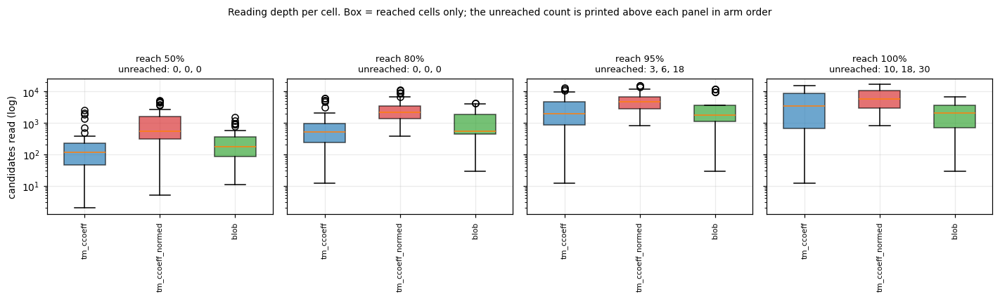

In [29]:
fig, axes = plt.subplots(1, len(DEPTH_TARGETS), figsize=(13, 3.6), sharey=True)
for i, f in enumerate(DEPTH_TARGETS):
    c = f"read_{int(f*100)}"
    data = [M.loc[M["arm"] == a, c].dropna().to_numpy() for a in ARMS]
    bp = axes[i].boxplot(data, labels=list(ARMS), patch_artist=True, widths=0.55)
    for patch, a in zip(bp["boxes"], ARMS):
        patch.set_facecolor(ARM_COLOUR[a]); patch.set_alpha(0.65)
    nun = [int(M.loc[M["arm"] == a, c].isna().sum()) for a in ARMS]
    axes[i].set_title(f"reach {int(f*100)}%\nunreached: " + ", ".join(map(str, nun)), fontsize=8.5)
    axes[i].set_yscale("log"); axes[i].tick_params(axis="x", labelrotation=90, labelsize=7)
axes[0].set_ylabel("candidates read (log)")
fig.suptitle("Reading depth per cell. Box = reached cells only; the unreached count is printed "
             "above each panel in arm order", y=1.06, fontsize=9)
fig.tight_layout(); plt.show()

### 8.4 What the false positives actually are

At a fixed reading budget, a false positive on a **pathologist-labelled look-alike** and a false
positive on **unannotated tissue** mean different things to the product. The first is a location
a human already examined and rejected -- the tool is proposing a genuinely hard negative, and a
reader will spend real time on it. The second is usually ordinary nucleus or stroma that a
reader dismisses at a glance.

Note the base rates differ per ROI (7 to 123 look-alike annotations), so the look-alike column
is also reported as a rate per annotated look-alike available.

Composition of the top K=100, macro-averaged over ROIs:


,n_read,tp_mitotic,fp_lookalike,fp_unannotated,n_lk_eval,lookalikes_hit_frac
arm,,,,,,
tm_ccoeff,100.0,27.57,9.80,62.63,59.82,0.16
tm_ccoeff_normed,100.0,14.10,5.28,80.62,59.82,0.09
blob,100.0,22.94,6.47,70.59,59.82,0.11
blob_raw,100.0,22.80,6.35,70.84,59.82,0.11


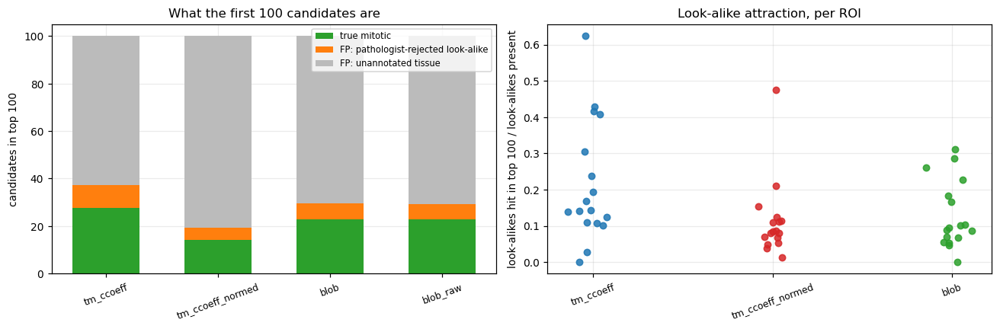

In [30]:
comp = macro(M[M["arm"].isin(ALL_ARMS)],
             ["n_read", "tp_mitotic", "fp_lookalike", "fp_unannotated", "n_lk_eval"])
comp = comp.loc[list(ALL_ARMS)]
comp["lookalikes_hit_frac"] = (comp["fp_lookalike"] / comp["n_lk_eval"]).round(3)
print(f"Composition of the top K={K_BUDGET}, macro-averaged over ROIs:")
display(comp.round(2))

fig, axes = plt.subplots(1, 2, figsize=(12, 4.0))
bot = np.zeros(len(ALL_ARMS))
for lbl, col, c in [("true mitotic", "tp_mitotic", "#2ca02c"),
                    ("FP: pathologist-rejected look-alike", "fp_lookalike", "#ff7f0e"),
                    ("FP: unannotated tissue", "fp_unannotated", "#bbbbbb")]:
    axes[0].bar(range(len(ALL_ARMS)), comp[col], 0.6, bottom=bot, label=lbl, color=c)
    bot += comp[col].to_numpy()
axes[0].set_xticks(range(len(ALL_ARMS))); axes[0].set_xticklabels(ALL_ARMS, rotation=20, fontsize=8)
axes[0].set_ylabel(f"candidates in top {K_BUDGET}"); axes[0].legend(fontsize=7.5)
axes[0].set_title(f"What the first {K_BUDGET} candidates are")

pr = (M[M["arm"].isin(ARMS)].groupby(["arm", "file_name"])[["fp_lookalike", "n_lk_eval"]]
      .mean().reset_index())
pr["rate"] = pr["fp_lookalike"] / pr["n_lk_eval"]
for k, a in enumerate(ARMS):
    d = pr[pr["arm"] == a]
    axes[1].scatter(np.full(len(d), k) + np.random.default_rng(k).normal(0, 0.06, len(d)),
                    d["rate"], color=ARM_COLOUR[a], s=30, alpha=0.85)
axes[1].set_xticks(range(len(ARMS))); axes[1].set_xticklabels(ARMS, rotation=20, fontsize=8)
axes[1].set_ylabel(f"look-alikes hit in top {K_BUDGET} / look-alikes present")
axes[1].set_title("Look-alike attraction, per ROI")
fig.tight_layout(); plt.show()

### 8.5 Seed variance

How much does the answer depend on *which* mitotic figure the pathologist happened to click?

For the two template-matching arms this is the real question -- the template is the click. For
the blob arm it is a different question wearing the same name: **its candidate list is identical
across seeds** (verified in section 3.4), so all of its variation comes from the evaluation
ground truth dropping a different annotation each time. Its low spread is therefore a
consequence of it ignoring the click, not evidence that it is a more stable detector. The prior
work's log stated "seedless arms are deterministic by construction" and its own coefficient-of-
variation table contradicted that; both halves of the correct statement are given here.

In [31]:
sv = (M[M["arm"].isin(ARMS)].groupby(["arm", "file_name"])["recall@budget"]
      .agg(n_seeds="count", mean="mean", sd="std", min="min", max="max").reset_index())
sv["cv"] = (sv["sd"] / sv["mean"]).replace([np.inf, -np.inf], np.nan)
sv["range"] = sv["max"] - sv["min"]
print(f"Seed variance in recall@{K_BUDGET}, per ROI per arm "
      "(n_seeds is shown because it is not equal everywhere):")
display(sv.round(3))
print("\nAcross ROIs, macro-averaged:")
display(sv.groupby("arm")[["sd", "cv", "range"]].mean().round(4).loc[list(ARMS)])

Seed variance in recall@100, per ROI per arm (n_seeds is shown because it is not equal everywhere):


,arm,file_name,n_seeds,mean,sd,min,max,cv,range
0,blob,002.tiff,3,0.583,0.072,0.500,0.625,0.124,0.125
1,blob,094.tiff,3,0.259,0.000,0.259,0.259,0.000,0.000
2,blob,201.tiff,3,0.549,0.034,0.529,0.588,0.062,0.059
3,blob,202.tiff,3,0.644,0.038,0.600,0.667,0.060,0.067
4,blob,245.tiff,3,0.090,0.000,0.090,0.090,0.000,0.000
5,blob,246.tiff,3,0.307,0.005,0.304,0.313,0.016,0.009
6,blob,300.tiff,3,0.400,0.000,0.400,0.400,0.000,0.000
7,blob,301.tiff,3,0.350,0.000,0.350,0.350,0.000,0.000
8,blob,350.tiff,3,0.556,0.192,0.333,0.667,0.346,0.333
9,blob,351.tiff,3,1.000,0.000,1.000,1.000,0.000,0.000



Across ROIs, macro-averaged:


,sd,cv,range
arm,,,
tm_ccoeff,0.0772,0.2262,0.1437
tm_ccoeff_normed,0.1136,0.7627,0.2093
blob,0.0231,0.0605,0.0399


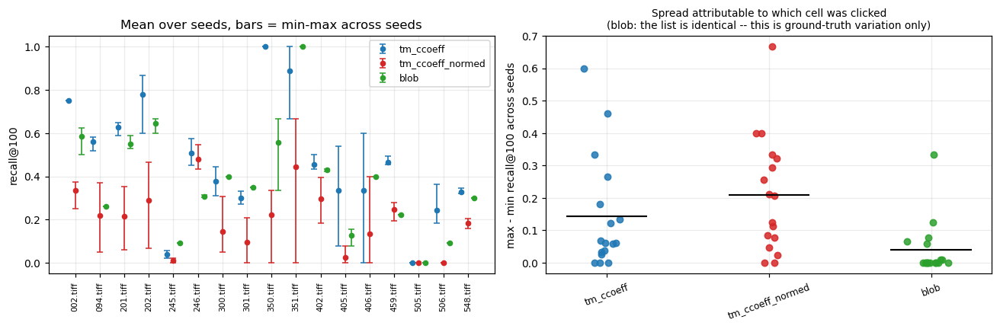

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4.0))
fns = sorted(sv["file_name"].unique()); xs = np.arange(len(fns)); w = 0.26
for k, a in enumerate(ARMS):
    d = sv[sv["arm"] == a].set_index("file_name").reindex(fns)
    # mean must lie within [min, max] mathematically; clip guards float rounding only
    lo_err = np.clip(d["mean"] - d["min"], 0, None)
    hi_err = np.clip(d["max"] - d["mean"], 0, None)
    axes[0].errorbar(xs + (k - 1) * w, d["mean"], yerr=[lo_err, hi_err],
                     fmt="o", ms=4, color=ARM_COLOUR[a], capsize=2.5, lw=1.1, label=a)
axes[0].set_xticks(xs); axes[0].set_xticklabels(fns, rotation=90, fontsize=7)
axes[0].set_ylabel(f"recall@{K_BUDGET}"); axes[0].legend(fontsize=8)
axes[0].set_title("Mean over seeds, bars = min-max across seeds")
for k, a in enumerate(ARMS):
    d = sv[sv["arm"] == a]["range"].dropna()
    axes[1].scatter(np.full(len(d), k) + np.random.default_rng(k).normal(0, 0.06, len(d)),
                    d, color=ARM_COLOUR[a], s=30, alpha=0.85)
    axes[1].hlines(d.mean(), k - 0.25, k + 0.25, color="k", lw=1.4)
axes[1].set_xticks(range(len(ARMS))); axes[1].set_xticklabels(ARMS, rotation=20, fontsize=8)
axes[1].set_ylabel(f"max - min recall@{K_BUDGET} across seeds")
axes[1].set_title("Spread attributable to which cell was clicked\n"
                  "(blob: the list is identical -- this is ground-truth variation only)",
                  fontsize=9)
fig.tight_layout(); plt.show()

### 8.6 Significance -- with what is detectable stated before the tests

**Seeds within an ROI are not independent.** They share the tissue, the stain, the scanner, the
annotator and the same ground truth minus one annotation. A paired test over all cells treats
each as an independent observation and will overstate significance. Both tests are therefore
reported:

* **per-cell paired test** -- Wilcoxon signed-rank over every (ROI, seed) pair. Liberal;
  its p-value is an upper bound on the evidence, not a measurement of it.
* **ROI-level test** -- each ROI collapsed to the mean over its seeds, then a Wilcoxon
  signed-rank and a two-sided sign test over ROIs. This is the one to believe.

**The two contrasts do not have equal pairing strength, and this is not symmetric.**
`tm_ccoeff` vs `tm_ccoeff_normed` is cleanly paired: identical seed, identical template,
identical everything but one `cv2` constant. **TM vs `blob` is not** -- the blob side
contributes *zero* seed-driven variance because it never sees the click, so the per-cell test
there has far less independent information than its n suggests and is close to a fixed-effect
comparison on one side. For TM-vs-blob, the ROI-level test is the only one worth reading.

**What is detectable at this sample size** (computed below before any test is run): with `n`
ROIs, a two-sided sign test cannot produce a p-value below `2 x 0.5^n` *even if every single ROI
favours the same arm*. Effect sizes and confidence intervals are reported alongside every
p-value, because a p-value at this n mostly measures the sample size.

In [33]:
n_roi = M["file_name"].nunique()
n_cell = M.groupby(["file_name", "seed_index"]).ngroups
print(f"n ROIs = {n_roi}; n cells = {n_cell}")
print(f"Floor on the ROI-level two-sided sign test at unanimity: p = 2 x 0.5^{n_roi} = "
      f"{2 * 0.5 ** n_roi:.2e}")
print(f"Floor on the per-cell two-sided sign test at unanimity:  p = 2 x 0.5^{n_cell} = "
      f"{2 * 0.5 ** n_cell:.2e}  (but the cells are clustered, so this floor is fictional)")
for k in range(n_roi, max(n_roi - 4, 0), -1):
    p = 2 * stats.binom.sf(k - 1, n_roi, 0.5)
    print(f"  {k}/{n_roi} ROIs favouring one arm -> sign-test p = {min(p,1.0):.4f}")

n ROIs = 17; n cells = 50
Floor on the ROI-level two-sided sign test at unanimity: p = 2 x 0.5^17 = 1.53e-05
Floor on the per-cell two-sided sign test at unanimity:  p = 2 x 0.5^50 = 1.78e-15  (but the cells are clustered, so this floor is fictional)
  17/17 ROIs favouring one arm -> sign-test p = 0.0000
  16/17 ROIs favouring one arm -> sign-test p = 0.0003
  15/17 ROIs favouring one arm -> sign-test p = 0.0023
  14/17 ROIs favouring one arm -> sign-test p = 0.0127


In [34]:
def contrast(metric, a, b, drop_na_note=True):
    '''Paired comparison of arm a minus arm b on `metric`, at cell level and ROI level.'''
    key = ["file_name", "seed_index"]
    A = M[M["arm"] == a].set_index(key)[metric]
    B = M[M["arm"] == b].set_index(key)[metric]
    d = (A - B).dropna()
    n_dropped = len(A) - len(d)

    def _wil(x):
        x = np.asarray(x, dtype=float)
        if len(x) < 3 or np.allclose(x, 0):
            return np.nan
        return float(stats.wilcoxon(x, zero_method="wilcox").pvalue)

    p_cell = _wil(d.to_numpy())
    roi_d = d.groupby("file_name").mean()
    p_roi = _wil(roi_d.to_numpy())
    nz = roi_d[roi_d != 0]
    p_sign = (float(stats.binomtest(int((nz > 0).sum()), len(nz), 0.5).pvalue)
              if len(nz) else np.nan)

    rng = np.random.default_rng(RNG_SEED)
    idx = roi_d.index.to_numpy()
    boot = np.array([roi_d.loc[rng.choice(idx, len(idx), replace=True)].mean()
                     for _ in range(4000)])
    lo, hi = np.percentile(boot, [2.5, 97.5])
    return {"metric": metric, "contrast": f"{a} - {b}",
            "n_cells": len(d), "n_cells_dropped_na": n_dropped, "n_rois": len(roi_d),
            "mean_diff_roi": float(roi_d.mean()), "ci95_lo": float(lo), "ci95_hi": float(hi),
            "median_diff_roi": float(roi_d.median()),
            "rois_diff_pos": int((roi_d > 0).sum()), "rois_diff_neg": int((roi_d < 0).sum()),
            "rois_tied": int((roi_d == 0).sum()),
            "p_percell_wilcoxon": p_cell, "p_roi_wilcoxon": p_roi, "p_roi_sign": p_sign}

PAIRS = [("tm_ccoeff", "tm_ccoeff_normed"), ("tm_ccoeff", "blob"), ("tm_ccoeff_normed", "blob")]
res = []
for metric in ["recall@budget", "ceiling_matched", "read_95"]:
    for a, b in PAIRS:
        res.append(contrast(metric, a, b))
sig = pd.DataFrame(res)
show = sig.copy()
for c in ["mean_diff_roi", "ci95_lo", "ci95_hi", "median_diff_roi"]:
    show[c] = show[c].round(4)
for c in ["p_percell_wilcoxon", "p_roi_wilcoxon", "p_roi_sign"]:
    show[c] = show[c].map(lambda v: "n/a" if not np.isfinite(v) else f"{v:.4f}")
display(show.set_index(["metric", "contrast"]))
print("`n_cells_dropped_na` on read_95 is the conditioning warning made explicit: those cells "
      "are\nones where at least one arm never reached 95%, so the test that remains is "
      "conditioned on\nboth arms succeeding. Read it together with the unreached counts in "
      "section 8.3.")

n_cells  n_cells_dropped_na  n_rois  mean_diff_roi    ci95_lo    ci95_hi  median_diff_roi  rois_diff_pos  rois_diff_neg  rois_tied p_percell_wilcoxon  \
metric          contrast                                                                                                                                                                              
recall@budget   tm_ccoeff - tm_ccoeff_normed       50                   0      17         0.2736     0.1878     0.3689           0.2315             16              0          1             0.0000   
                tm_ccoeff - blob                   50                   0      17         0.0985     0.0326     0.1707           0.0784             11              5          1             0.0004   
                tm_ccoeff_normed - blob            50                   0      17        -0.1751    -0.2592    -0.0946          -0.1346              2             14          1             0.0000   
ceiling_matched tm_ccoeff - tm_ccoeff_normed       50                   0      17         0.0184     0.0079     0.0296           0.0116             11              1          5             0.0001   
                tm_ccoeff - blob                   50                   0      17         0.0279    -0.0031     0.0595           0.0000              8              3          6             0.0006   
                tm_ccoeff_normed - blob            50                   0      17         0.0095    -0.0193     0.0388           0.0000              7              7          3             0.1524   
read_95         tm_ccoeff - tm_ccoeff_normed       43                   7      16     -2069.1354 -2946.8362 -1207.0346       -1932.6667              3             13          0             0.0000   
                tm_ccoeff - blob                   31                  19      11       520.1667 -2174.7197  2841.2458         955.0000              7              4          0             0.2724   
                tm_ccoeff_normed - blob            30                  20      11      3142.1212    84.2038  5549.9583        4003.6667             10              1          0             0.0012   

                                             p_roi_wilcoxon p_roi_sign  
metric          contrast                                                
recall@budget   tm_ccoeff - tm_ccoeff_normed         0.0004     0.0000  
                tm_ccoeff - blob                     0.0229     0.2101  
                tm_ccoeff_normed - blob              0.0023     0.0042  
ceiling_matched tm_ccoeff - tm_ccoeff_normed         0.0047     0.0063  
                tm_ccoeff - blob                     0.0754     0.2266  
                tm_ccoeff_normed - blob              0.6378     1.0000  
read_95         tm_ccoeff - tm_ccoeff_normed         0.0010     0.0213  
                tm_ccoeff - blob                     0.3652     0.5488  
                tm_ccoeff_normed - blob              0.0537     0.0117

`n_cells_dropped_na` on read_95 is the conditioning warning made explicit: those cells are
ones where at least one arm never reached 95%, so the test that remains is conditioned on
both arms succeeding. Read it together with the unreached counts in section 8.3.


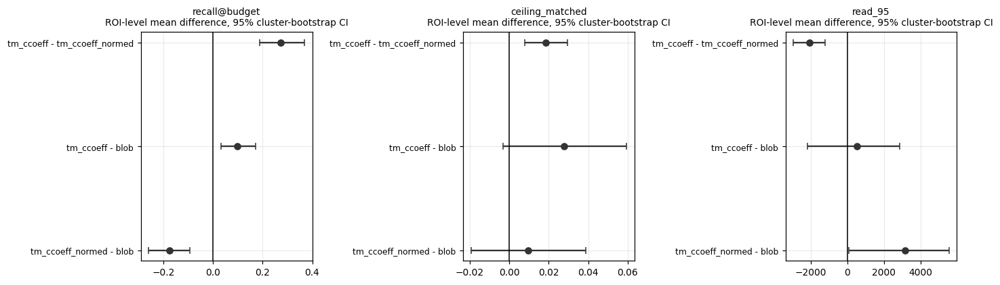

A confidence interval that straddles zero is the result. It is not a null result to be
argued around, and at this sample size it is the expected outcome for a modest effect.


In [35]:
fig, axes = plt.subplots(1, 3, figsize=(13, 3.9))
for ax, metric in zip(axes, ["recall@budget", "ceiling_matched", "read_95"]):
    d = sig[sig["metric"] == metric]
    ys = np.arange(len(d))
    # a percentile bootstrap CI need not bracket the sample mean exactly at small n; clip
    lo_err = np.clip(d["mean_diff_roi"] - d["ci95_lo"], 0, None)
    hi_err = np.clip(d["ci95_hi"] - d["mean_diff_roi"], 0, None)
    ax.errorbar(d["mean_diff_roi"], ys, xerr=[lo_err, hi_err],
                fmt="o", color="#333", capsize=3)
    ax.axvline(0, color="k", lw=1)
    ax.set_yticks(ys); ax.set_yticklabels(d["contrast"], fontsize=8)
    ax.set_title(f"{metric}\nROI-level mean difference, 95% cluster-bootstrap CI", fontsize=9)
    ax.invert_yaxis()
fig.tight_layout(); plt.show()
print("A confidence interval that straddles zero is the result. It is not a null result to be\n"
      "argued around, and at this sample size it is the expected outcome for a modest effect.")

### 8.7 The alternative aggregation, since it is the obvious objection

Everything above weights each ROI equally. Pooling all mitotic annotations instead lets
548.tiff (239), 301.tiff (218) and 300.tiff (181) supply most of the weight. Both are shown so
that no conclusion below rests on the choice.

In [36]:
rows = []
for a in ALL_ARMS:
    d = M[M["arm"] == a]
    # micro: pool every annotation across every cell, weighting cells by their mitosis count
    hit = sum(int(((np.asarray(r) >= 0) & (np.asarray(r) < K_BUDGET)).sum()) for r in d["mit_rank"])
    tot = sum(int(np.asarray(r).size) for r in d["mit_rank"])
    hitc = sum(int((np.asarray(r) >= 0).sum()) for r in d["mit_rank"])
    rows.append({"arm": a, f"micro recall@{K_BUDGET}": round(100 * hit / tot, 1),
                 "micro ceiling @full": round(100 * hitc / tot, 1),
                 f"macro recall@{K_BUDGET}": round(100 * float(
                     d.groupby("file_name")["recall@budget"].mean().mean()), 1),
                 "macro ceiling @full": round(100 * float(
                     d.groupby("file_name")["ceiling_full"].mean().mean()), 1)})
display(pd.DataFrame(rows).set_index("arm").loc[list(ALL_ARMS)])
print("Where these two columns disagree, the disagreement is the finding: it means the arms "
      "differ\nmostly on the dense ROIs, or mostly on the sparse ones, and one aggregation is "
      "hiding that.")

,micro recall@100,micro ceiling @full,macro recall@100,macro ceiling @full
arm,,,,
tm_ccoeff,38.1,99.7,47.0,99.3
tm_ccoeff_normed,19.5,99.2,19.6,98.4
blob,31.7,97.3,37.1,96.0
blob_raw,31.5,97.8,37.0,96.3


Where these two columns disagree, the disagreement is the finding: it means the arms differ
mostly on the dense ROIs, or mostly on the sparse ones, and one aggregation is hiding that.


## 9. Predictions against ground truth

Numbers hide what the arms actually put in front of a reader. Below, the same ROI crop under all
three arms, with the top-500 candidates of each drawn and colour-coded by what they landed on:

* **green** -- a real mitotic figure (`human_correct_label`)
* **orange** -- a look-alike a pathologist examined and rejected (`human_rejected_label`)
* **grey** -- unannotated tissue (`non_human_findings`)

Ground truth is drawn as unfilled circles: lime for mitotic figures, cyan for look-alikes. A
lime circle with no green marker inside it is a miss. The clicked seed, when it falls in the
crop, is drawn as a white square -- it is excluded from the ground truth and from every arm's
candidate list.

The first crop is chosen automatically as the place where the arms **disagree most**: a mitotic
figure one arm ranks inside the reading budget and another misses entirely.

In [37]:
long = []
for _, r in M[M["arm"].isin(ARMS)].iterrows():
    for aid, rk in zip(r["mit_ann"], r["mit_rank"]):
        long.append((r["file_name"], r["seed_index"], r["arm"], int(aid), int(rk)))
long = pd.DataFrame(long, columns=["file_name", "seed_index", "arm", "ann_id", "rank"])
piv = long.pivot_table(index=["file_name", "seed_index", "ann_id"], columns="arm",
                       values="rank").reset_index()
K_SHOW = TOPN_RETAIN
inb = piv[list(ARMS)].apply(lambda c: (c >= 0) & (c < K_SHOW))
piv["n_arms_in_budget"] = inb.sum(axis=1)
disagree = piv[(piv["n_arms_in_budget"] > 0) & (piv["n_arms_in_budget"] < len(ARMS))].copy()
print(f"{len(disagree)} of {len(piv)} (annotation, seed) cases are found in the top {K_SHOW} by "
      f"some arms and not others")
print("split by which arms had it, most common patterns:")
pat = disagree.assign(pattern=inb.loc[disagree.index].apply(
    lambda r: "+".join(a for a in ARMS if r[a]), axis=1))
print(pat["pattern"].value_counts().head(8).to_string())

# pick the case with the largest rank gap, preferring one where blob and TM disagree
disagree["gap"] = (disagree[list(ARMS)].replace(-1, np.nan).max(axis=1)
                   - disagree[list(ARMS)].replace(-1, np.nan).min(axis=1))
cand = pat[(pat["pattern"] != "") & (~pat["pattern"].isin(["+".join(ARMS)]))].copy()
cand["gap"] = disagree["gap"]
cand["tm_vs_blob"] = cand["pattern"].map(lambda p: ("blob" in p) != ("tm_ccoeff" in p
                                                                    or "tm_ccoeff_normed" in p))
cand = cand.sort_values(["tm_vs_blob", "n_arms_in_budget"], ascending=[False, True])
if not len(cand):
    raise RuntimeError("no cross-arm disagreement found -- the crop below cannot be selected "
                       "automatically; widen K_SHOW or inspect `piv` by hand")
pick = cand.iloc[0]
print(f"\nchosen disagreement crop: {pick['file_name']} seed {int(pick['seed_index'])} "
      f"annotation {int(pick['ann_id'])}  ranks -> "
      + ", ".join(f"{a}={int(pick[a])}" for a in ARMS))

1872 of 3689 (annotation, seed) cases are found in the top 500 by some arms and not others
split by which arms had it, most common patterns:
pattern
tm_ccoeff+blob                916
blob                          445
tm_ccoeff+tm_ccoeff_normed    236
tm_ccoeff                     185
tm_ccoeff_normed               56
tm_ccoeff_normed+blob          34

chosen disagreement crop: 002.tiff seed 0 annotation 6  ranks -> tm_ccoeff=168, tm_ccoeff_normed=794, blob=-1


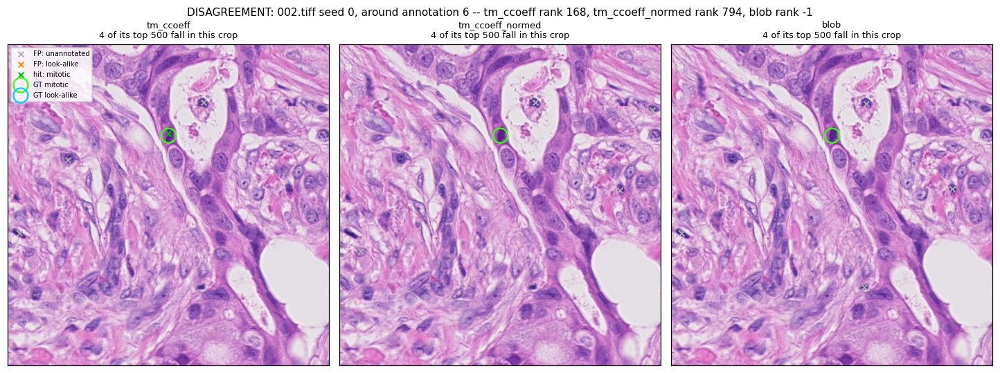

In [38]:
def overlay(fn, s_idx, centre, half, title, rgb_cache={}):
    if fn not in rgb_cache:
        rgb_cache.clear(); rgb_cache[fn] = ds.load_roi(IMAGES / fn)
    rgb = rgb_cache[fn]
    h, w = rgb.shape[:2]
    cx, cy = centre
    x0 = int(np.clip(cx - half, 0, w - 2 * half)); y0 = int(np.clip(cy - half, 0, h - 2 * half))
    x1, y1 = x0 + 2 * half, y0 + 2 * half
    gt = ann[ann["file_name"] == fn]
    seed_id = int(M[(M.file_name == fn) & (M.seed_index == s_idx)]["seed_ann_id"].iloc[0])

    fig, axes = plt.subplots(1, len(ARMS), figsize=(13.2, 4.9))
    for ax, a in zip(axes, ARMS):
        ax.imshow(rgb[y0:y1, x0:x1]); ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
        d = RETAIN[(fn, s_idx, a)]
        d = d[(d.cx >= x0) & (d.cx < x1) & (d.cy >= y0) & (d.cy < y1)]
        for b, col, lab in [(ev.NON_HUMAN_FINDINGS, "#b0b0b0", "FP: unannotated"),
                            (ev.HUMAN_REJECTED_LABEL, "#ff8c00", "FP: look-alike"),
                            (ev.HUMAN_CORRECT_LABEL, "#00c000", "hit: mitotic")]:
            sel = d[d["bucket"] == b]
            ax.scatter(sel.cx - x0, sel.cy - y0, s=26, c=col, marker="x", lw=1.3, label=lab)
        for cat, col, lab in [(ds.MITOTIC, "#39ff14", "GT mitotic"),
                              (ds.LOOKALIKE, "#00d0ff", "GT look-alike")]:
            g = gt[(gt.category_id == cat) & (gt.cx >= x0) & (gt.cx < x1)
                   & (gt.cy >= y0) & (gt.cy < y1) & (gt.ann_id != seed_id)]
            ax.scatter(g.cx - x0, g.cy - y0, s=190, facecolors="none", edgecolors=col, lw=1.5,
                       label=lab)
        sg = gt[(gt.ann_id == seed_id) & (gt.cx >= x0) & (gt.cx < x1)
                & (gt.cy >= y0) & (gt.cy < y1)]
        if len(sg):
            ax.scatter(sg.cx - x0, sg.cy - y0, s=230, marker="s", facecolors="none",
                       edgecolors="white", lw=2.0, label="the click (excluded)")
        n_in = len(d)
        ax.set_title(f"{a}\n{n_in} of its top {TOPN_RETAIN} fall in this crop", fontsize=8.5)
    axes[0].legend(fontsize=6.5, loc="upper left", framealpha=0.85)
    fig.suptitle(title, y=1.0, fontsize=10)
    fig.tight_layout(); plt.show()

fn_d, s_d = pick["file_name"], int(pick["seed_index"])
a_row = ann[ann["ann_id"] == int(pick["ann_id"])].iloc[0]
overlay(fn_d, s_d, (a_row["cx"], a_row["cy"]), 380,
        f"DISAGREEMENT: {fn_d} seed {s_d}, around annotation {int(pick['ann_id'])} -- "
        + ", ".join(f"{a} rank {int(pick[a])}" for a in ARMS))

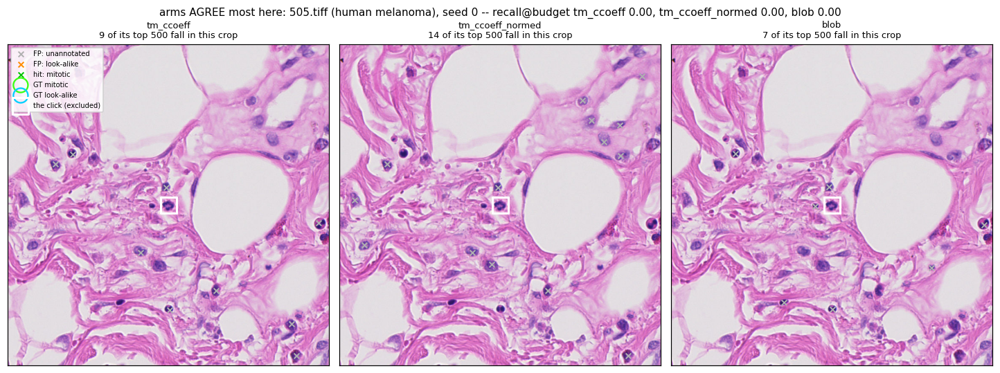

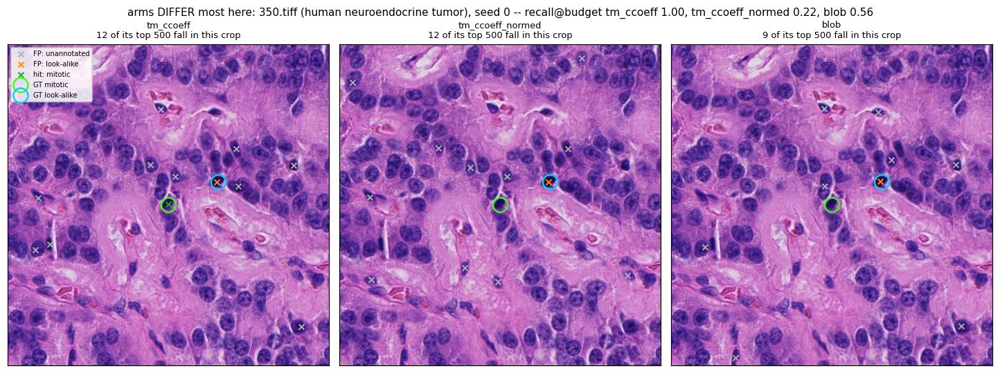

In [39]:
# Two further crops: the ROI where the arms agree most, and a sparse-domain ROI.
per_roi_rb = M[M["arm"].isin(ARMS)].pivot_table(index="file_name", columns="arm",
                                                values="recall@budget")
spread = (per_roi_rb.max(axis=1) - per_roi_rb.min(axis=1)).sort_values()
for fn_x, lab in [(spread.index[0], "arms AGREE most here"),
                  (spread.index[-1], "arms DIFFER most here")]:
    g = ann[(ann.file_name == fn_x) & (ann.category_id == ds.MITOTIC)]
    with tifffile.TiffFile(IMAGES / fn_x) as tf:
        s_ = tf.series[0]; lv = getattr(s_, "levels", None)
        shp = (lv[0].shape if lv else s_.shape)[:2]
    gg = g[(g.cx > 400) & (g.cx < shp[1] - 400) & (g.cy > 400) & (g.cy < shp[0] - 400)]
    if not len(gg):
        continue
    c = gg.iloc[len(gg) // 2]
    d = per_roi_rb.loc[fn_x]
    overlay(fn_x, 0, (c["cx"], c["cy"]), 380,
            f"{lab}: {fn_x} ({roi.loc[roi.file_name==fn_x,'tumor_type'].iloc[0]}), seed 0 -- "
            + "recall@budget " + ", ".join(f"{a} {d[a]:.2f}" for a in ARMS))

## 10. What the tool is being asked to distinguish

The evaluation counts a hit on a category-2 annotation as a false positive, which is correct for
the metric and understates the difficulty. Category 2 is not background: it is a structure a
pathologist looked at, considered, and rejected. This montage shows a few of each per domain at
the same magnification. The point is not that any arm should have found these -- it is that the
false-positive composition in section 8.4 is measuring something genuinely hard.

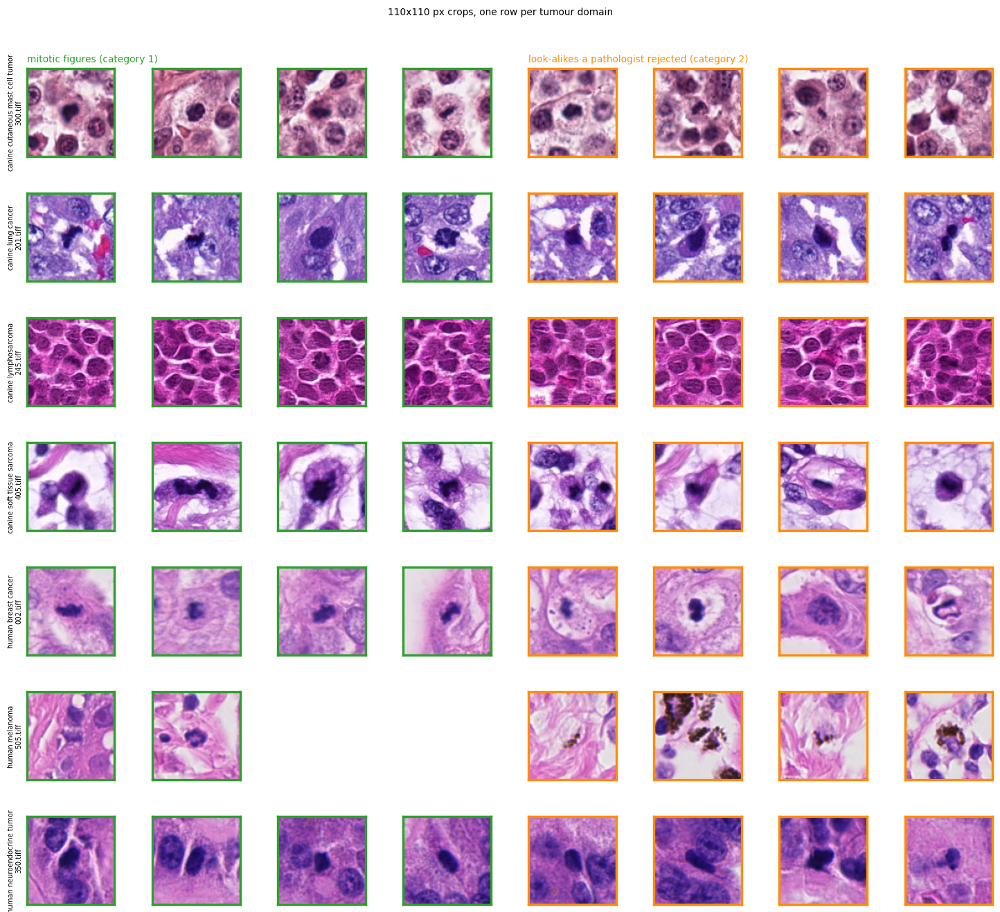

In [40]:
rng = np.random.default_rng(RNG_SEED)
n_each = 4
fig, axes = plt.subplots(len(demo_rois), 2 * n_each, figsize=(13.2, 1.72 * len(demo_rois)))
for i, fn in enumerate(demo_rois):
    with timed("montage"):
        rgb = ds.load_roi(IMAGES / fn)
    h, w = rgb.shape[:2]
    for cat, off, col in [(ds.MITOTIC, 0, "#2ca02c"), (ds.LOOKALIKE, n_each, "#ff8c00")]:
        g = ann[(ann.file_name == fn) & (ann.category_id == cat)]
        g = g[(g.cx > 60) & (g.cx < w - 60) & (g.cy > 60) & (g.cy < h - 60)]
        take = g.iloc[rng.choice(len(g), min(n_each, len(g)), replace=False)] if len(g) else g
        for j in range(n_each):
            ax = axes[i, off + j]
            ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
            if j < len(take):
                c = take.iloc[j]
                y, x = int(c["cy"]), int(c["cx"])
                ax.imshow(rgb[y - 55:y + 55, x - 55:x + 55])
            else:
                ax.axis("off")
            for sp in ax.spines.values():
                sp.set_color(col); sp.set_linewidth(2.2)
    axes[i, 0].set_ylabel(f"{roi.loc[roi.file_name==fn,'tumor_type'].iloc[0]}\n{fn}", fontsize=6.5)
    del rgb
axes[0, 0].set_title("mitotic figures (category 1)", loc="left", fontsize=9, color="#2ca02c")
axes[0, n_each].set_title("look-alikes a pathologist rejected (category 2)", loc="left",
                          fontsize=9, color="#ff8c00")
fig.suptitle("110x110 px crops, one row per tumour domain", y=1.005, fontsize=9)
fig.tight_layout(); plt.show()

## 11. What this notebook found

The cell below reads the verdict off the numbers rather than off a narrative. A contrast is
called **inconclusive** whenever its ROI-level 95% confidence interval contains zero -- which,
at this sample size, is the outcome to expect for anything but a large effect. No threshold, no
budget and no aggregation rule below was chosen after seeing a result.

In [41]:
def verdict(metric, a, b, higher_is_better=True):
    r = sig[(sig["metric"] == metric) & (sig["contrast"] == f"{a} - {b}")].iloc[0]
    lo, hi = r["ci95_lo"], r["ci95_hi"]
    d = r["mean_diff_roi"]
    if not (np.isfinite(d) and np.isfinite(lo) and np.isfinite(hi)):
        # e.g. read_95 where no cell had BOTH arms reach the target: there is nothing to compare
        call = (f"NOT COMPUTABLE -- {int(r['n_cells'])} usable pairs "
                f"({int(r['n_cells_dropped_na'])} cells dropped because at least one arm never "
                "reached this target)")
    elif lo <= 0 <= hi:
        call = "INCONCLUSIVE at this sample size"
    else:
        better = (d > 0) == higher_is_better
        call = f"{a if better else b} ahead"
    return (f"  {metric:<16s} {a} - {b}:  {d:+.4f}  [95% CI {lo:+.4f}, {hi:+.4f}]  "
            f"ROI split {int(r['rois_diff_pos'])}+/{int(r['rois_diff_neg'])}-"
            f"{('-' + str(int(r['rois_tied'])) + ' tied') if r['rois_tied'] else ''}  "
            f"sign p={r['p_roi_sign']:.3f}\n"
            f"  {'':<16s} -> {call}")

print("=" * 100)
print("HEADLINE, at the stated aggregation (mean over seeds, then equal weight per ROI)")
print("=" * 100)
mm = macro(M[M["arm"].isin(ALL_ARMS)], ["recall@budget", "ceiling_matched", "coverage_matched"])
for a in ALL_ARMS:
    print(f"  {a:<20s} recall@{K_BUDGET} = {100*mm.loc[a,'recall@budget']:5.1f}%   "
          f"ceiling@matched = {100*mm.loc[a,'ceiling_matched']:5.1f}%   "
          f"(coverage@matched = {mm.loc[a,'coverage_matched']:.3f})")
print()
print("=" * 100)
print("CONTRAST 1 -- the method axis: one changed cv2 constant, everything else identical")
print("=" * 100)
for metric, hib in [("recall@budget", True), ("ceiling_matched", True), ("read_95", False)]:
    print(verdict(metric, "tm_ccoeff", "tm_ccoeff_normed", hib))
print()
print("=" * 100)
print("CONTRAST 2 -- does the click earn its place? seeded arms vs the seedless control")
print("(the ROI-level test is the only one to read here: the blob side contributes no")
print(" seed-driven variance, so the per-cell test is nearly a fixed-effect comparison)")
print("=" * 100)
for a in TM_ARMS:
    for metric, hib in [("recall@budget", True), ("ceiling_matched", True), ("read_95", False)]:
        print(verdict(metric, a, "blob", hib))
    print()
print("=" * 100)
print("THE CORRECTION THAT WAS APPLIED BEFORE ANY OF THIS WAS COMPUTED")
print("=" * 100)
braw = macro(M[M["arm"].isin(ALL_ARMS)], ["recall@budget"])
print(f"  blob (suppressed, as compared here) recall@{K_BUDGET} = "
      f"{100*braw.loc['blob','recall@budget']:.1f}%")
print(f"  blob_raw (unsuppressed, as shipped) recall@{K_BUDGET} = "
      f"{100*braw.loc['blob_raw','recall@budget']:.1f}%")
_delta = 100 * (braw.loc['blob', 'recall@budget'] - braw.loc['blob_raw', 'recall@budget'])
print(f"  Suppressing the blob arm identically to the TM arms changes its recall@{K_BUDGET} by "
      f"{_delta:+.2f} points.")
print("  The correction was applied for symmetry, before any result was seen, because the "
      "mechanism\n  (one-to-one greedy matching plus redundant components) is structural. Its "
      "measured size is\n  the number above, reported whether it is large or negligible. What "
      "suppression reliably does\n  change is the blob arm's coverage at matched length -- "
      "section 8.2.")

HEADLINE, at the stated aggregation (mean over seeds, then equal weight per ROI)
  tm_ccoeff            recall@100 =  47.0%   ceiling@matched =  98.8%   (coverage@matched = 0.670)
  tm_ccoeff_normed     recall@100 =  19.6%   ceiling@matched =  96.9%   (coverage@matched = 0.684)
  blob                 recall@100 =  37.1%   ceiling@matched =  96.0%   (coverage@matched = 0.680)
  blob_raw             recall@100 =  37.0%   ceiling@matched =  95.9%   (coverage@matched = 0.616)

CONTRAST 1 -- the method axis: one changed cv2 constant, everything else identical
  recall@budget    tm_ccoeff - tm_ccoeff_normed:  +0.2736  [95% CI +0.1878, +0.3689]  ROI split 16+/0--1 tied  sign p=0.000
                   -> tm_ccoeff ahead
  ceiling_matched  tm_ccoeff - tm_ccoeff_normed:  +0.0184  [95% CI +0.0079, +0.0296]  ROI split 11+/1--5 tied  sign p=0.006
                   -> tm_ccoeff ahead
  read_95          tm_ccoeff - tm_ccoeff_normed:  -2069.1354  [95% CI -2946.8362, -1207.0346]  ROI split 3+/13-  si

## 12. What this establishes, and what it does not

### It establishes

* **The pipeline is arithmetically what it claims to be.** The coordinate frame round-trips
  within 1 px under both methods (3.1); OpenCV's response map matches a float64 recomputation
  of the textbook formula to better than 1e-3 relative (3.2); truncating the deep candidate pool
  is coordinate-identical to re-running the pipeline at that cut, and greedy matching is
  prefix-consistent, so every `recall@K` and reading depth here is exact rather than approximate
  (3.3); `nucleus_blobs` is deterministic and genuinely blind to the click (3.4).
* **Neither CCOEFF arm degenerates.** MAD > 0 and the peak cap never binds on any cell. The
  failure that invalidated an entire arm in the prior work does not occur here, and that is
  asserted over the whole sweep rather than on a sampled gate.
* **A like-for-like comparison of the three arms** on 17 ROIs across all 7 tumour domains, under
  one channel, one template bank, one threshold rule, one suppression radius per image and one
  evaluation, with the two template-matching arms differing in exactly one `cv2` constant.
* **The size of one methodological choice that was nearly made wrongly**: suppressing the blob
  arm identically to the template arms, rather than comparing against its raw component list.

### It does not establish

* **Anything about held-out data.** Every ROI in `images/` is from the MIDOG++ **train** split.
  A 111-slide held-out test split exists and has never been touched by any work in this
  repository, including this notebook. Nothing here is an estimate of out-of-sample performance,
  and the channel, the threshold rule and the suppression radius were all settled on this same
  data in earlier work.
* **Small effects.** With 17 ROIs the ROI-level sign test bottoms out around `p = 1.5e-5` at
  unanimity, but any contrast whose per-ROI differences are not consistent in sign will produce
  a confidence interval straddling zero. Where the verdict above says *inconclusive*, that is
  the finding: this sample cannot resolve the difference, and running more seeds would not fix
  it because seeds within an ROI are not independent observations.
* **That either detector is clinically useful.** Recall at a reading budget is not a clinical
  endpoint. Nothing here measures reader time, reader trust, or what happens when the clicked
  cell is atypical of the rest of the ROI.
* **That `nucleus_blobs` is a fair ceiling for click-free detection.** It is one seedless
  baseline with four untuned constants (`min_area=80`, `max_area=4000`, `tile=512`,
  `gray_max=220`) that no ground truth is available to set at inference time. A stronger
  click-free detector -- or a trained one -- would be a different and harder control. The
  asymmetry runs the other way too: the click supplies the template's size and its stain
  intensity for free, which is an advantage that appears in no table here.
* **Generalisation across scanners or labs.** Domains are represented by one to three ROIs each.
  Per-domain numbers in section 8 are single-ROI observations in several cases and should be
  read as illustrations, not estimates.

### On the prior results in this repository

Nothing above cites an earlier conclusion from this repo as established, and the two contrasts
were computed the same way regardless of which direction the earlier work pointed. The one place
this notebook deliberately departs from the prior design is the framing: the seedless detector
is treated here as **one control among the arms**, not as a bar the seeded method must clear.
`Research Logs/2026-09-01-tm-variant-sweep.md` section 9 documents why that distinction mattered
-- an unaudited file was given load-bearing status, worst-of-N was used as a headline in a way
that structurally penalised the seeded arm, and failures were reported asymmetrically. The
aggregation convention in section 8 (mean over seeds, equal weight per ROI, both arms' failures
reported on the same denominator) is the correction.